# Functional connectome similarity within families (2021)

### (C) Philip Brandner, September 2021

This notebook is the entire analysis pipeline for the Paper on Family functional connectome similarity.

See Nilearn Tutorial for resting-state: https://nilearn.github.io/connectivity/index.html


# Outline



___

# Processing Decisions

### Slice-Timing

This is a limitation of the DICOM files created by Philips 1. I would suggest you lobby your Philips Research Collaboration Manager to have this information stored in the DICOM files for future Philips software versions. In the mean time, you will need to BIDS SliceTiming field yourself. You will need to know:

- Repetition Time (time between start of one volume and start of the next) (BIDS RepetitionTime and NIfTI pixdim[4]).
- Delay Between Volumes (is there a temporal gap between the acquisition of the last slice of one volume and the first slice of the next).
- Number of Slices (NIfTI dim[3])
- Multiband factor
- Ascending or descending slice order
- Sequential of interleaved slice order.

see: https://neurostars.org/t/warning-1-code-13-slice-timing-not-defined/5273/2

see also: https://fmriprep.org/en/stable/workflows.html?highlight=slicetiming#slice-time-correction

See SPM Wiki: https://en.wikibooks.org/wiki/SPM/Slice_Timing#Multiband_EPI_acquisitions

**Maybe SliceTiming correction is not necessary with MULTIBAND becaus of such a short TR?**

With very small TRs such as multiband, it becomes very complicated to slice time correct because there are usually a high number of slices and any slight movement might make slice time correction to correct the wrong slice, and this correction is less necessary as the TR is small and the temporal difference between slices is thus reduced. In such cases, you can choose to skip slice timing correction (or use a temporal derivative, which can account for +/- 1 second of changes in timing[5]).

However, it was shown that slice timing correction is always beneficial, even for fast TR < 2s such as obtained with multiband[2]. Indeed, it was observed that slice timing correction helps more with the slices that are more delayed (ie, towards the end of the slice order) and that slice timing correction increases the statistical effect size the longer the TR, with diminishing returns as the TR is shorter, down to 0.5s where the common methods of slice timing correction do not help anymore[32]. However, with new slice timing correction methods such as upsampling and lowpass filtering, there is still a significant gain, that is constant whatever the TR[32].

Paper: https://www.frontiersin.org/articles/10.3389/fnins.2019.00821/full

fMRIprep uses AFNI's 3dTshift algorithm. Does it make sense to use it with that?
see: https://afni.nimh.nih.gov/pub/dist/doc/program_help/3dTshift.html

"We have successfully analyzed multiband data for various tasks using FMRIPREP with similar settings and using similar confound regressors on first level. The only exception is that we used **--ignore slicetiming** option."
see: https://neurostars.org/t/fmriprep-advices-for-multiband/747

### CONCLUSION: Don't use STC in fmriprep

### Parcellation choice

see Schaefer et al. 2018:http://people.csail.mit.edu/ythomas/publications/2018LocalGlobal-CerebCor.pdf

github: https://github.com/ThomasYeoLab/CBIG/tree/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal


### Yeo's networks 7

![alt text](https://github.com/ThomasYeoLab/CBIG/raw/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal/readme_figures/Schaefer2018_400parcel_parcellation_match_Yeo_7_network_fslr32k.png "Title")




#### Question: How many parcels to choose from the Schaefer template? (100-1000)

- 400 Parcels, seems a reasonable standard number for whole cortex (bilateral)
- Why not the highest number of parcels (1000)? Don't forget with ICA-AROMA we get 6mm smoothing built in!


#### Question: Which space should i do all my analysis (fsaverage - more appropriate for FC, MNI)?

- d


### ICA-AROMA

https://github.com/nipreps/fmriprep/issues/1799

https://neurostars.org/t/fmriprep-ica-aroma-filtering-including-wm-csf-etc-confounds-in-fsl-regfilt/3137
also: https://github.com/nipreps/fmriprep/issues/817

notebook examples:
- https://github.com/nipreps/fmriprep-notebooks/blob/9933a628dfb759dc73e61701c144d67898b92de0/05%20-%20Discussion%20AROMA%20confounds%20-%20issue-817%20%5BJ.%20Kent%5D.ipynb
- https://github.com/oesteban/aroma-chris-notebook/blob/master/Denoising%2Bthe%2Bdenoising.ipynb


#### fMRIprep
**For datasets with a very short TR and a large number of timepoints, this may result in an unusually high number of components. By default, dimensionality is limited to a maximum of 200 components.** 

To override this upper limit one may specify the number of components to be extracted with **--aroma-melodic-dimensionality**. Further details on the implementation are given within the workflow generation function (init_ica_aroma_wf()).


- set --aroma-melodic-dimensionality to 50 (currently our subjects get >130)


Note: non-aggressive AROMA denoising is a fundamentally different procedure from its “aggressive” counterpart and cannot be performed only by using a set of noise regressors (a separate GLM with both noise and signal regressors needs to be used). Therefore instead of regressors, fMRIPrep produces non-aggressive denoised 4D NIFTI files in the MNI space:

*space-MNI152NLin6Asym_desc-smoothAROMAnonaggr_bold.nii.gz


#### Isssue #1 ICA-AROMA is in MNI152 space, what about the parcellation method I want to use local/global?

Looks like Schaefers parcellations come in MNI space. should be fine! It works!

![title](/Users/philipb/surfdrive/PhD/BRAINLINKS/T1_Ouderstudie/images/fmriprep_ica_aroma.jpg)

If you are already using AROMA-cleaned data (~desc-smoothAROMAnonaggr_bold.nii.gz), do not include ICA-AROMA confounds during your design specification or denoising procedure.

Additionally, as per [Hallquist2013] and [Lindquist2019], when using AROMA-cleaned data most of the confound regressors should be recalculated (this feature is a work-in-progress, follow up on #1905). Surprisingly, our simulations (with thanks to JD. Kent) suggest that using the confounds as currently calculated by fMRIPrep –before denoising– would be just fine.

see: https://fmriprep.org/en/stable/outputs.html#derivatives-of-fmriprep-preprocessed-data

### aCompCor

*Opinions on this topic are divided and this is why FMRIPREP provides those regressors instead of cleaning up the data for you. I personally would include 6 motion parameters, FD, and aCompCor on run level and mean FD on group level (for both task and rest).*

Chris Gor. (https://neurostars.org/t/confounds-from-fmriprep-which-one-would-you-use-for-glm/326)

- Best Practices aCompCor: https://neurostars.org/t/best-practices-for-aroma-and-fmriprep/1619

## Low-bandpass Filtering

see: https://carpentries-incubator.github.io/SDC-BIDS-fMRI/05-data-cleaning-with-nilearn/index.html

##  How to vectorize connectome matrix

Should be pretty straightforward with nilearn: https://nilearn.github.io/modules/generated/nilearn.connectome.ConnectivityMeasure.html

- nilearn.connectome.ConnectivityMeasure

has a vectorize boolean, that converts the matrix into a 1D vector.

- Play around with that and do some initial correlations.

## START HERE: Nilearn Tutorials


- GENERAL NILEARN 101: https://carpentries-incubator.github.io/SDC-BIDS-fMRI/

- Specific Nilearn tutorial: https://nilearn.github.io/auto_examples/03_connectivity/plot_group_level_connectivity.html



___

# 0) Tutorial: Nilearn basic functions

Nilearn can fetch many different atlases, including the one we'll be using (Schaefer et al. 2018).
- 400 parcels
- 7 networks (yeo et al. 2011)
- resolution 2mm


In [2]:
import os
import pandas as pd
import numpy as np
import pingouin as pg
import seaborn as sns
from bids import BIDSLayout
import nibabel as nib
from nilearn import datasets
from nilearn import plotting as plot
from nilearn import image as img
from nilearn.input_data import NiftiLabelsMasker
from nilearn.connectome import ConnectivityMeasure

import matplotlib.pyplot as plt

import logging
logging.getLogger('matplotlib.font_manager').disabled = True

%matplotlib inline

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/nilearn/datasets/__init__.py:86: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "


In [341]:
import nilearn
nilearn.__version__

'0.8.0'

### How to install packages
- https://jakevdp.github.io/blog/2017/12/05/installing-python-packages-from-jupyter/

In [9]:
 # Install a pip package in the current Jupyter kernel
import sys
!{sys.executable} -m pip install pybids

You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.9/bin/python3 -m pip install --upgrade pip' command.


# Themes, Color, Presets

In [326]:
from matplotlib.colors import LinearSegmentedColormap

within_color = '#6F8ABF'
family_color = '#6CBFCC'
family_parent_child_color = '#52D99E'
family_parent_parent_color = '#225941'

child_child_color = '#F2BB16'
child_adult_color = '#F2A81D'
adult_adult_color = '#F2994B'

main_regression_color = '#BF5315'

cmap = LinearSegmentedColormap.from_list('RedGreenRed', ['#6F8ABF','#6CBFCC', '#FFFFFF', '#F2BB16','#A64D2D'])

# Set the font and figure settings in seaborn
# see: http://seaborn.pydata.org/tutorial/aesthetics.html

sns.set(font_scale = 2)
sns.set_style("ticks")


In [279]:
within_color

'#6F8ABF'

___

# 1) Import subjects & basic setup

## 1.1) Define Schaefer - 100 ROI atlas

dict_keys(['maps', 'labels', 'description'])


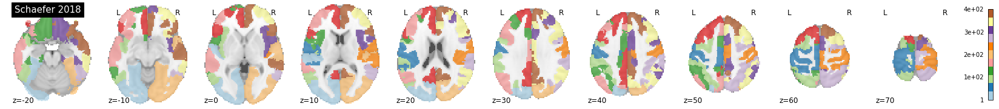

In [6]:
# First we need to fetch the Schaefer 2018 atlas and store it in a variable for atlas_filename & labels
atlas = datasets.fetch_atlas_schaefer_2018(n_rois=400, yeo_networks=7, resolution_mm=2, data_dir=None, base_url=None, resume=True, verbose=1)
atlas_filename = atlas.maps
labels = atlas.labels

print(atlas.keys())
# plotting.plot_roi(atlas_filename,title="Schaefer 2018",view_type = "continuous")
plot.plot_roi(atlas_filename,
                  cut_coords=(-20,-10,0,10,20,30,40,50,60,70),
                  display_mode='z',
                  colorbar=True,
                  cmap='Paired',
                  title='Schaefer 2018')

In [7]:
#Base directory from fMRIprep output
fmriprep_dir = '/Users/philipb/owncloud/2018_Brainlinks (Projectfolder)/Brainlinks_Parentstudy/Brainlinks_Parentstudy_Analyses/functional_connectome/fmriprep_final'
layout = BIDSLayout(fmriprep_dir,validate=False)

# Show the subjects of your BIDS dir
layout.get_subjects()

#layout.get_tasks()

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/bids/layout/models.py:148: FutureWarning: The 'extension' entity currently excludes the leading dot ('.'). As of version 0.14.0, it will include the leading dot. To suppress this warning and include the leading dot, use `bids.config.set_option('extension_initial_dot', True)`.
  warnings.warn("The 'extension' entity currently excludes the leading dot ('.'). "


['BL065',
 'BL067',
 'BL073',
 'BL076',
 'BL077',
 'BL081',
 'BL082',
 'BL084',
 'BL086',
 'BL087',
 'BL088',
 'BL089',
 'BL090',
 'BL092',
 'BL096',
 'BL102',
 'BL104',
 'BL111',
 'BL113',
 'BL114',
 'BL115',
 'BL117',
 'BL122',
 'BL127',
 'BL131',
 'BL134',
 'BL135',
 'BL138',
 'BL140',
 'BL142',
 'BL143',
 'BL154',
 'BL155',
 'BL156',
 'BL160',
 'BL161',
 'BL163',
 'BL169',
 'BL177',
 'BL182',
 'BL185',
 'BL188',
 'BL192',
 'BL198',
 'BL203',
 'BL206',
 'BL209',
 'BL210',
 'BL212',
 'BL214',
 'BL217',
 'BL0651',
 'BL0652',
 'BL0671',
 'BL0731',
 'BL0761',
 'BL0771',
 'BL0772',
 'BL0812',
 'BL0821',
 'BL0822',
 'BL0841',
 'BL0862',
 'BL0871',
 'BL0881',
 'BL0882',
 'BL0891',
 'BL0901',
 'BL0921',
 'BL0922',
 'BL0961',
 'BL1022',
 'BL1041',
 'BL1111',
 'BL1112',
 'BL1131',
 'BL1141',
 'BL1142',
 'BL1151',
 'BL1171',
 'BL1172',
 'BL1221',
 'BL1222',
 'BL1272',
 'BL1311',
 'BL1312',
 'BL1341',
 'BL1351',
 'BL1352',
 'BL1381',
 'BL1382',
 'BL1401',
 'BL1422',
 'BL1431',
 'BL1432',
 'BL15

___

# 2) Extract time series & process data

For input and output see: https://nilearn.github.io/manipulating_images/input_output.html

In [8]:
# Create subject list that takes sessions into account
# see: https://bids-standard.github.io/pybids/layout/index.html

# 1) Read the BIDS dataset and check the number of sessions that person has
subjects_session_list = []
subject_sessions = []
subjects = layout.get_subjects()

# 2) Preprocessing exclusion list
preprocessing_exclusion_list = ['BL114']

for excluded in preprocessing_exclusion_list:
    if excluded in subjects: subjects.remove(excluded)

for sub in subjects:
    subject_sessions = layout.get_sessions(subject=sub,task="rest")
    subject_sessions_length = len(subject_sessions)
    print(sub,subject_sessions)
    print('Length of list: ',len(subject_sessions))
    subject_list_name1 = sub + '-1'
    subject_list_name2 = sub + '-2'
    if subject_sessions_length == 2:
        subjects_session_list.append(subject_list_name1)
        subjects_session_list.append(subject_list_name2)
    else:
        subjects_session_list.append(subject_list_name1)
print(subjects_session_list)

BL065 ['01', '02']
Length of list:  2
BL067 ['01', '02']
Length of list:  2
BL073 ['01']
Length of list:  1
BL076 ['01']
Length of list:  1
BL077 ['01', '02']
Length of list:  2
BL081 ['01', '02']
Length of list:  2
BL082 ['01', '02']
Length of list:  2
BL084 ['01', '02']
Length of list:  2
BL086 ['01', '02']
Length of list:  2
BL087 ['01', '02']
Length of list:  2
BL088 ['01', '02']
Length of list:  2
BL089 ['01', '02']
Length of list:  2
BL090 ['01']
Length of list:  1
BL092 ['01', '02']
Length of list:  2
BL096 ['01', '02']
Length of list:  2
BL102 ['01', '02']
Length of list:  2
BL104 ['01']
Length of list:  1
BL111 ['01', '02']
Length of list:  2
BL113 ['01', '02']
Length of list:  2
BL115 ['01']
Length of list:  1
BL117 ['01', '02']
Length of list:  2
BL122 ['01', '02']
Length of list:  2
BL127 ['01', '02']
Length of list:  2
BL131 ['01', '02']
Length of list:  2
BL134 ['01', '02']
Length of list:  2
BL135 ['01', '02']
Length of list:  2
BL138 ['01', '02']
Length of list:  2
BL14

## 2.1) Create correlation matrices after denoising, detrending, smoothing

In [9]:
#Set denoising constants
print(len(subjects),' Subjects in total')
sessions = layout.get_session()
confound_vars = ['trans_x','trans_y','trans_z','rot_x','rot_y','rot_z','global_signal','a_comp_cor_00','a_comp_cor_01','a_comp_cor_02','a_comp_cor_03','a_comp_cor_04','a_comp_cor_05']
high_pass= 0.009
low_pass = 0.08
TR=0.69
prefix='sub-'
prefix_ses='ses-'
sessions = ['ses-01','ses-02']

# Allowed connectivity kinds are "correlation", "partial correlation", 
#"tangent", "covariance" and "precision", got kind "full correlation"
correlation_type = 'partial correlation'
subjects_timeseries = []
all_connectomes = []
empty_subjects = []
print('-------------- Empty All connectome list -----------')
print(all_connectomes)

# let's loop through all subjects and create correlation matrices    
for sub in subjects:
    
    # Get functional images
    for ses in sessions:
        print('------------------------------------ Subject: ' + sub + ' session: ' + ses + ' -----------------------------------------')

        try:
            func_file = os.path.join(fmriprep_dir,prefix+sub,ses,'func',prefix+sub+'_'+ses+'_task-rest_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz')
            # LOAD IMAGE 
            func_img = img.load_img(func_file)
            func_file_missing = False
        except:
            func_file_missing = True
            print('No functional file for subject: ',sub)
            if ses == 'ses-01':
                empty_subject_name = sub + '-1'
            elif ses == 'ses-02':
                empty_subject_name = sub + '-2'
            empty_subjects.append(empty_subject_name)

        # Get confounds
        try:
            confound_file = os.path.join(fmriprep_dir,prefix+sub,ses,'func',prefix+sub+'_'+ses+'_task-rest_desc-confounds_timeseries.tsv')
            confound_df = pd.read_csv(confound_file,delimiter='\t')
            confounds = confound_df[confound_vars]
        except:
            print('No confound file for subject: ',sub)


        # The input_data.NiftiLabelsMasker object is a wrapper that applies parcellation, cleaning and averaging to an functional image
        masker = NiftiLabelsMasker(labels_img=atlas_filename,
                                   standardize=True, # the signal is z-scored to the mean (important for later vectorizing)
                                   verbose=0,
                                   memory='nilearn_cache',
                                   detrend=True,
                                   smoothing_fwhm=6,
                                   low_pass=low_pass,
                                   high_pass=high_pass,
                                   t_r=TR)

        #time_series = masker.fit_transform(result_image,confounds=confounds)
        if func_file_missing == False:
            time_series = masker.fit_transform(func_img,confounds)
            subjects_timeseries.append(time_series)
            
            # Compute vectorized 1D matrix for comparison & save to subject directory
            connectivity = ConnectivityMeasure(kind=correlation_type,vectorize=True,discard_diagonal=True)
            connectome_1d = connectivity.fit_transform([time_series])

            # Combine all vectorized 1D arrays into a larger array Subjects 
            # THIS IS USED FOR FURTHER ANALYSIS because it is VECTORIZED
            all_connectomes.append(connectome_1d)
        else:
            continue
            

# Compute connectivity matrix from time_series
# THIS IS USED FOR Functional connectome Visualization
correlation_measure = ConnectivityMeasure(kind='correlation')
correlation_matrix = correlation_measure.fit_transform(subjects_timeseries)
print('--------- Subjects time series SHAPE -----------')
print(correlation_matrix.shape)

    
# Combine all connectomes into 1 big numpy array
# see: https://stackoverflow.com/questions/58083743/what-is-the-fastest-way-to-stack-numpy-arrays-in-a-loop

all_connectome_final = np.concatenate(all_connectomes,axis=0)
all_connectome_final = np.transpose(all_connectome_final)

126  Subjects in total
-------------- Empty All connectome list -----------
[]
------------------------------------ Subject: BL065 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL065 session: ses-02 -----------------------------------------
------------------------------------ Subject: BL067 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL067 session: ses-02 -----------------------------------------
------------------------------------ Subject: BL073 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL073 session: ses-02 -----------------------------------------
No functional file for subject:  BL073
No confound file for subject:  BL073
------------------------------------ Subject: BL076 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL076 session: ses-02 -------

------------------------------------ Subject: BL163 session: ses-02 -----------------------------------------
------------------------------------ Subject: BL169 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL169 session: ses-02 -----------------------------------------
------------------------------------ Subject: BL177 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL177 session: ses-02 -----------------------------------------
------------------------------------ Subject: BL182 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL182 session: ses-02 -----------------------------------------
------------------------------------ Subject: BL185 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL185 session: ses-02 -----------------------------------------
----------

------------------------------------ Subject: BL0901 session: ses-02 -----------------------------------------
No functional file for subject:  BL0901
No confound file for subject:  BL0901
------------------------------------ Subject: BL0921 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL0921 session: ses-02 -----------------------------------------
No functional file for subject:  BL0921
No confound file for subject:  BL0921
------------------------------------ Subject: BL0922 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL0922 session: ses-02 -----------------------------------------
No functional file for subject:  BL0922
No confound file for subject:  BL0922
------------------------------------ Subject: BL0961 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL0961 session: ses-02 -------------------------------

------------------------------------ Subject: BL1541 session: ses-02 -----------------------------------------
No functional file for subject:  BL1541
No confound file for subject:  BL1541
------------------------------------ Subject: BL1542 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL1542 session: ses-02 -----------------------------------------
No functional file for subject:  BL1542
No confound file for subject:  BL1542
------------------------------------ Subject: BL1551 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL1551 session: ses-02 -----------------------------------------
No functional file for subject:  BL1551
No confound file for subject:  BL1551
------------------------------------ Subject: BL1561 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL1561 session: ses-02 -------------------------------

------------------------------------ Subject: BL2121 session: ses-02 -----------------------------------------
No functional file for subject:  BL2121
No confound file for subject:  BL2121
------------------------------------ Subject: BL2141 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL2141 session: ses-02 -----------------------------------------
No functional file for subject:  BL2141
No confound file for subject:  BL2141
------------------------------------ Subject: BL2171 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL2171 session: ses-02 -----------------------------------------
No functional file for subject:  BL2171
No confound file for subject:  BL2171
------------------------------------ Subject: BL2172 session: ses-01 -----------------------------------------
------------------------------------ Subject: BL2172 session: ses-02 -------------------------------

In [12]:
family_classifier = all_connectome_final

try:
    np.savetxt("ML_connectome_classifier.csv",family_classifier,delimiter=",")
    
except:
    print('Family classifier couldnt be saved')

print('---------------- ALL CONNECTOMES POST LOOP ------------')
print(all_connectome_final)
    
## Numpy's array into pandas table with subject headers
# First remove empty subjects from subject_list

for empty in empty_subjects:
    if empty in subjects_session_list: subjects_session_list.remove(empty)

print('----- Empty subjects list ---------')
print(empty_subjects)
print('----- Adjusted subjects list ---------')
print(subjects_session_list)

subjects_connectomes_all = pd.DataFrame(data=all_connectome_final,columns=subjects_session_list)
print(subjects_connectomes_all)
subjects_connectomes_all.to_csv("connectomes_all.csv")

# Here we calculate the subject to subject correlation matrix for their vectorized within subject connectivity matrix
subjects_connectome_correlation_matrix = subjects_connectomes_all.corr().abs()
print(subjects_connectome_correlation_matrix)
subjects_connectome_correlation_matrix.to_csv("/Users/philipb/owncloud/2018_Brainlinks (Projectfolder)/Brainlinks_Parentstudy/Brainlinks_Parentstudy_Analyses/functional_connectome/fmriprep_final/1_subjects_connectome_correlation_matrix.csv")

---------------- ALL CONNECTOMES POST LOOP ------------
[[ 0.04391735  0.04170143  0.05042165 ...  0.07155534  0.05096627
   0.12296375]
 [ 0.04947157  0.02607266  0.05564007 ...  0.01243765  0.06361908
   0.05109678]
 [-0.03012444 -0.02900176  0.03178832 ... -0.01713846  0.01678188
   0.05109793]
 ...
 [ 0.05115489  0.04099404  0.06086254 ...  0.04066236  0.04168078
   0.03555245]
 [-0.00766271  0.00514613  0.0326312  ...  0.01297501 -0.00776663
  -0.02144868]
 [ 0.05498897  0.03263193  0.05112956 ...  0.03691103  0.04623354
   0.05898113]]
----- Empty subjects list ---------
['BL073-2', 'BL076-2', 'BL090-2', 'BL104-2', 'BL115-2', 'BL209-2', 'BL210-2', 'BL217-2', 'BL0651-2', 'BL0652-2', 'BL0671-2', 'BL0731-2', 'BL0761-2', 'BL0771-2', 'BL0772-2', 'BL0812-2', 'BL0821-2', 'BL0822-2', 'BL0841-2', 'BL0862-2', 'BL0871-2', 'BL0881-2', 'BL0882-2', 'BL0891-2', 'BL0901-2', 'BL0921-2', 'BL0922-2', 'BL0961-2', 'BL1022-2', 'BL1041-2', 'BL1111-2', 'BL1112-2', 'BL1131-2', 'BL1141-2', 'BL1142-2', 'BL

In [13]:
# Let's create a connectome correlation matrix with only ses-1 connectomes (no ses-2)
# We will need this for the Finn et al. replication with family identification

subjects_connectomes_all_no_ses_2 = subjects_connectomes_all.loc[:, ~subjects_connectomes_all.columns.str.contains('-2$')]
subjects_connectome_correlation_matrix_no_ses_2 = subjects_connectomes_all_no_ses_2.corr()
subjects_connectome_correlation_matrix_no_ses_2.values[[np.arange(subjects_connectome_correlation_matrix_no_ses_2.shape[0])]*2] = 0
subjects_connectome_correlation_matrix_no_ses_2.head()

/var/folders/61/y9cfvk950f749kh5tk_l5mrh0000gn/T/ipykernel_57628/3805807588.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  subjects_connectome_correlation_matrix_no_ses_2.values[[np.arange(subjects_connectome_correlation_matrix_no_ses_2.shape[0])]*2] = 0


,BL065-1,BL067-1,BL073-1,BL076-1,BL077-1,BL081-1,BL082-1,BL084-1,BL086-1,BL087-1,...,BL2032-1,BL2061-1,BL2062-1,BL2092-1,BL2101-1,BL2102-1,BL2121-1,BL2141-1,BL2171-1,BL2172-1
BL065-1,0.000000,0.204673,0.209544,0.221483,0.211994,0.216184,0.206095,0.240264,0.212765,0.210059,...,0.163240,0.196541,0.175932,0.200967,0.164214,0.198560,0.178626,0.176812,0.193121,0.174863
BL067-1,0.204673,0.000000,0.178458,0.196535,0.185152,0.194644,0.177581,0.210368,0.199366,0.194330,...,0.150960,0.177887,0.174303,0.187703,0.151104,0.167000,0.147743,0.165960,0.165948,0.166502
BL073-1,0.209544,0.178458,0.000000,0.196252,0.189185,0.187860,0.177073,0.205245,0.190123,0.190509,...,0.152437,0.162504,0.168846,0.191336,0.152413,0.176339,0.154584,0.159387,0.173050,0.163677
BL076-1,0.221483,0.196535,0.196252,0.000000,0.207609,0.214842,0.200815,0.226708,0.202507,0.198588,...,0.164897,0.187908,0.167584,0.191969,0.166571,0.187058,0.170387,0.174741,0.176939,0.170523
BL077-1,0.211994,0.185152,0.189185,0.207609,0.000000,0.208815,0.179017,0.229401,0.203038,0.186068,...,0.149275,0.180931,0.167915,0.184691,0.164866,0.173093,0.162667,0.174013,0.167262,0.174334


In [45]:
all_connectome_final.shape

(79800, 168)

In [46]:
correlation_matrix.shape

(168, 400, 400)

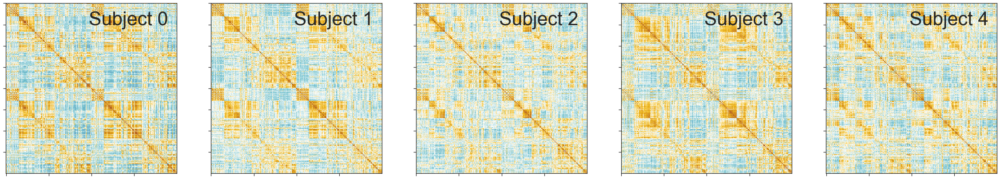

In [47]:
from nilearn import plotting
from matplotlib import pyplot as plt

_, axes = plt.subplots(1, 5, figsize=(40, 20))
for i, (matrix, ax) in enumerate(zip(correlation_matrix, axes)):
    plotting.plot_matrix(matrix, tri='full',colorbar=False, axes=ax,
                         title='Subject {}'.format(i),
                        vmin=-1,vmax=1,cmap=cmap)

RESULTS/Figures/matrices_all/functional_connectome_1.png


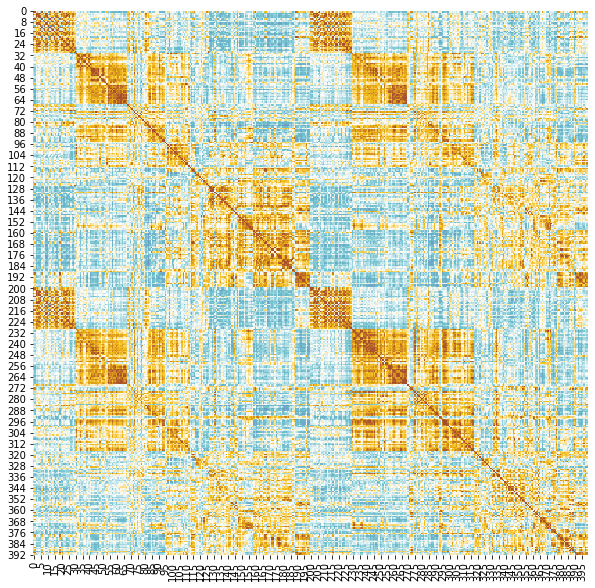

In [64]:
# https://seaborn.pydata.org/generated/seaborn.heatmap.html?highlight=heatmap#seaborn.heatmap
plt.figure(figsize=(15,10))

for i in range(1,2):
    sns.heatmap(correlation_matrix[i],cmap=cmap,square=True,robust=False,cbar=False,
                vmin=-0.8,vmax=0.8,center=0)
    figure_name = 'RESULTS/Figures/matrices_all/functional_connectome_' + str(i) + '.png'
    print(figure_name)
    plt.savefig(figure_name, dpi = 150)

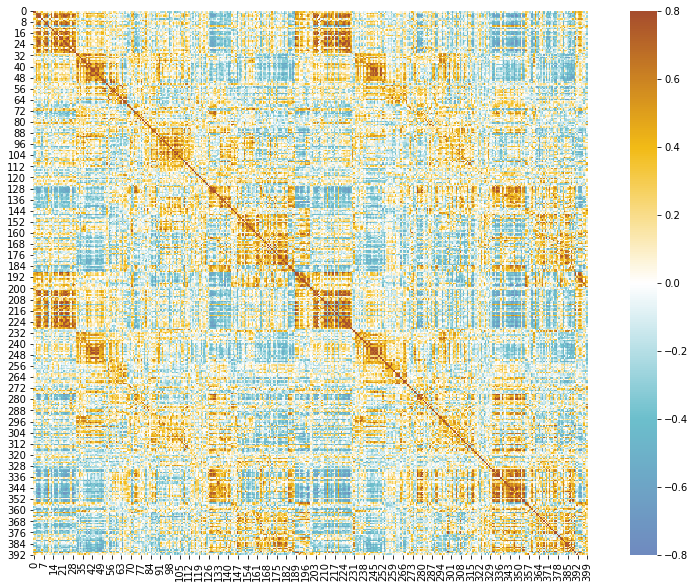

In [106]:
# https://seaborn.pydata.org/generated/seaborn.heatmap.html?highlight=heatmap#seaborn.heatmap
plt.figure(figsize=(15,10))

sns.heatmap(correlation_matrix[70],cmap=cmap,square=True,robust=False,cbar=True,
            vmin=-0.8,vmax=0.8,center=0)

## 2.2) Mean group level connectivity matrix

https://nilearn.github.io/auto_examples/03_connectivity/plot_group_level_connectivity.html

In [22]:
children_timeseries = subjects_timeseries[0:91]
adult_timeseries = subjects_timeseries[92:168]

In [23]:
# First we need to create correlation measures and fir the matrices to the timeseries

# FOR CHILDREN
correlation_measures_children = ConnectivityMeasure(kind='correlation')
correlation_matrices_children = correlation_measures_children.fit_transform(children_timeseries)

# FOR ADULTS
correlation_measures_adults = ConnectivityMeasure(kind='correlation')
correlation_matrices_adults = correlation_measures_adults.fit_transform(adult_timeseries)

mean_connectivity_matrix_children = correlation_measures_children.mean_
mean_connectivity_matrix_adults = correlation_measures_adults.mean_


<AxesSubplot:>

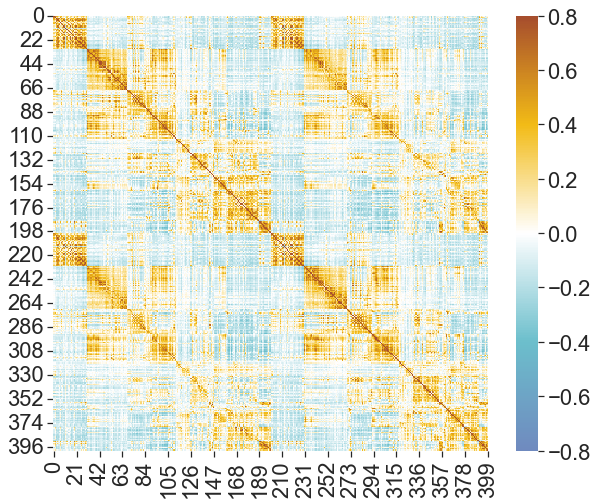

In [24]:
plt.figure(figsize=(10,8))
sns.heatmap(mean_connectivity_matrix_children,cmap=cmap,square=True,robust=False,cbar=True,
                vmin=-0.8,vmax=0.8,center=0)

<AxesSubplot:>

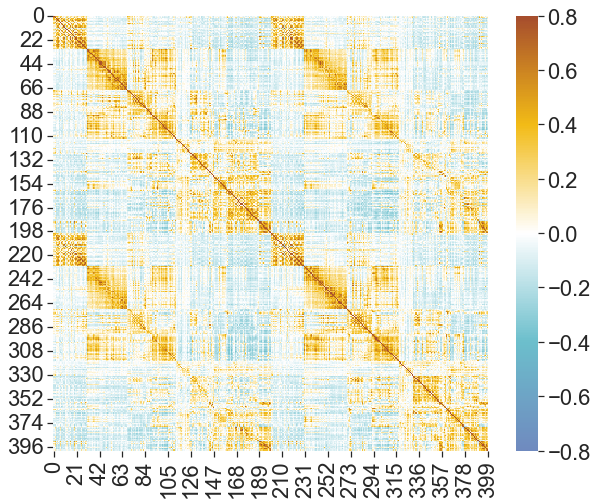

In [25]:
plt.figure(figsize=(10,8))
sns.heatmap(mean_connectivity_matrix_adults,cmap=cmap,square=True,robust=False,cbar=True,
                vmin=-0.8,vmax=0.8,center=0)

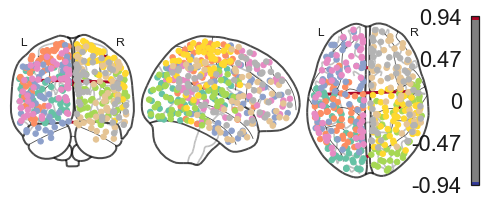

In [27]:
# Let's look at the first subjects connectome in anatomical space
# See = https://nilearn.github.io/modules/generated/nilearn.plotting.plot_connectome.html#nilearn.plotting.plot_connectome
# RdYlBu_r

coords = plot.find_parcellation_cut_coords(atlas.maps)
connectome = plot.plot_connectome(correlation_matrix[50], 
                                  node_coords=coords,
                                  edge_threshold=0.9,
                                  edge_cmap = 'RdYlBu_r',
                                  node_size=30,
                                  annotate=True,
                                  colorbar=True)
connectome

In [28]:
# Let's look at the first subjects connectome in anatomical space
# See = https://nilearn.github.io/modules/generated/nilearn.plotting.view_connectome.html#nilearn.plotting.view_connectome

coords = plot.find_parcellation_cut_coords(atlas.maps)
connectome = plot.view_connectome(correlation_matrix[50], 
                                  node_coords=coords,
                                  edge_threshold=0.80,
                                  linewidth=10)
connectome

See: https://nilearn.github.io/auto_examples/03_connectivity/plot_signal_extraction.html#sphx-glr-auto-examples-03-connectivity-plot-signal-extraction-py

___

# 3 Group comparison (FC similarity)

___

In [48]:
# Let's make sure we give the diagonal a 0 value so we can find the highest correlation value without 
# hitting the diagonal
subjects_connectome_correlation_matrix.values[[np.arange(subjects_connectome_correlation_matrix.shape[0])]*2] = 0
subjects_connectome_correlation_matrix.head()

/var/folders/61/y9cfvk950f749kh5tk_l5mrh0000gn/T/ipykernel_72599/2188538300.py:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  subjects_connectome_correlation_matrix.values[[np.arange(subjects_connectome_correlation_matrix.shape[0])]*2] = 0


,BL065-1,BL065-2,BL067-1,BL067-2,BL073-1,BL076-1,BL077-1,BL077-2,BL081-1,BL081-2,...,BL2032-1,BL2061-1,BL2062-1,BL2092-1,BL2101-1,BL2102-1,BL2121-1,BL2141-1,BL2171-1,BL2172-1
BL065-1,0.000000,0.302492,0.204673,0.225204,0.209544,0.221483,0.211994,0.217848,0.216184,0.217987,...,0.163240,0.196541,0.175932,0.200967,0.164214,0.198560,0.178626,0.176812,0.193121,0.174863
BL065-2,0.302492,0.000000,0.203761,0.223477,0.191563,0.213963,0.206082,0.221275,0.208553,0.222254,...,0.168302,0.194297,0.170882,0.203860,0.162696,0.194668,0.170622,0.169001,0.185327,0.174272
BL067-1,0.204673,0.203761,0.000000,0.255957,0.178458,0.196535,0.185152,0.204912,0.194644,0.198633,...,0.150960,0.177887,0.174303,0.187703,0.151104,0.167000,0.147743,0.165960,0.165948,0.166502
BL067-2,0.225204,0.223477,0.255957,0.000000,0.186846,0.209656,0.199701,0.232351,0.207003,0.213054,...,0.157149,0.195292,0.186707,0.199293,0.151575,0.179784,0.176629,0.172604,0.173644,0.178842
BL073-1,0.209544,0.191563,0.178458,0.186846,0.000000,0.196252,0.189185,0.189810,0.187860,0.197290,...,0.152437,0.162504,0.168846,0.191336,0.152413,0.176339,0.154584,0.159387,0.173050,0.163677


In [49]:
subjects_connectome_correlation_matrix.shape

(168, 168)

<AxesSubplot:>

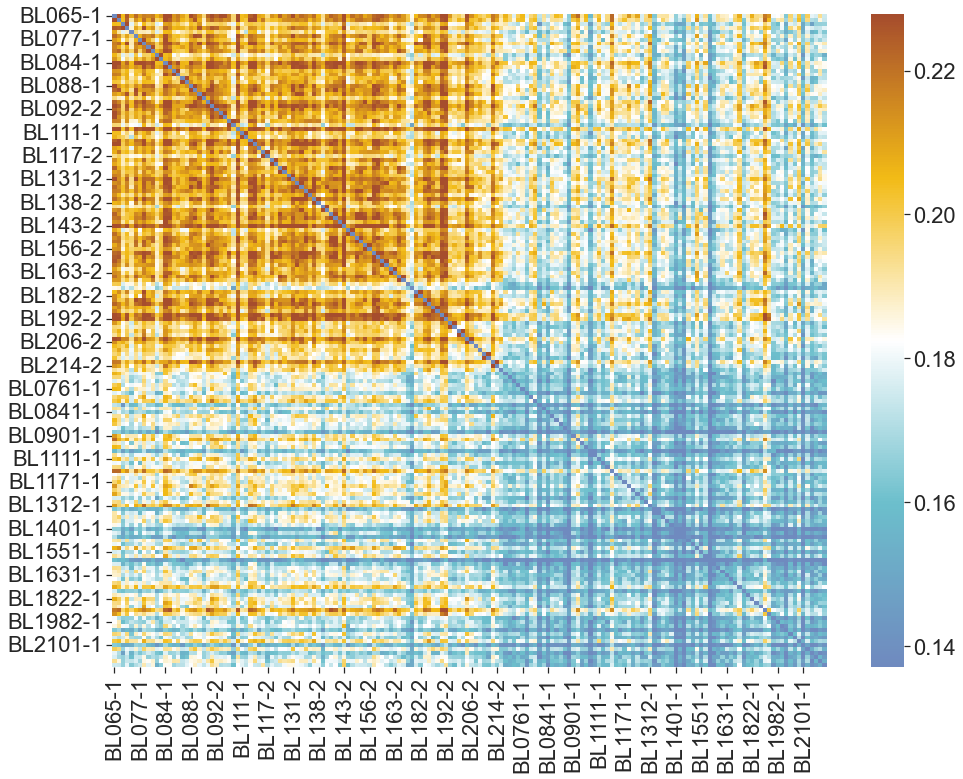

In [50]:
# let's look at the heatmap of our subjects connectivity map associations #cmaps: YlGnBu, 
# sns.heatmap(subjects_connectome_correlation_matrix,cmap="OrRd",vmin=0.1,vmax=0.35)
plt.figure(figsize=(16,12))
sns.heatmap(subjects_connectome_correlation_matrix,
                    robust=True,cmap=cmap)

In [51]:
subjects_connectome_correlation_matrix

,BL065-1,BL065-2,BL067-1,BL067-2,BL073-1,BL076-1,BL077-1,BL077-2,BL081-1,BL081-2,...,BL2032-1,BL2061-1,BL2062-1,BL2092-1,BL2101-1,BL2102-1,BL2121-1,BL2141-1,BL2171-1,BL2172-1
BL065-1,0.000000,0.302492,0.204673,0.225204,0.209544,0.221483,0.211994,0.217848,0.216184,0.217987,...,0.163240,0.196541,0.175932,0.200967,0.164214,0.198560,0.178626,0.176812,0.193121,0.174863
BL065-2,0.302492,0.000000,0.203761,0.223477,0.191563,0.213963,0.206082,0.221275,0.208553,0.222254,...,0.168302,0.194297,0.170882,0.203860,0.162696,0.194668,0.170622,0.169001,0.185327,0.174272
BL067-1,0.204673,0.203761,0.000000,0.255957,0.178458,0.196535,0.185152,0.204912,0.194644,0.198633,...,0.150960,0.177887,0.174303,0.187703,0.151104,0.167000,0.147743,0.165960,0.165948,0.166502
BL067-2,0.225204,0.223477,0.255957,0.000000,0.186846,0.209656,0.199701,0.232351,0.207003,0.213054,...,0.157149,0.195292,0.186707,0.199293,0.151575,0.179784,0.176629,0.172604,0.173644,0.178842
BL073-1,0.209544,0.191563,0.178458,0.186846,0.000000,0.196252,0.189185,0.189810,0.187860,0.197290,...,0.152437,0.162504,0.168846,0.191336,0.152413,0.176339,0.154584,0.159387,0.173050,0.163677
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BL2102-1,0.198560,0.194668,0.167000,0.179784,0.176339,0.187058,0.173093,0.197129,0.189205,0.190158,...,0.147681,0.172981,0.158694,0.176641,0.148514,0.000000,0.152512,0.166158,0.170346,0.154048
BL2121-1,0.178626,0.170622,0.147743,0.176629,0.154584,0.170387,0.162667,0.169703,0.175603,0.171482,...,0.137696,0.155180,0.148802,0.158880,0.132265,0.152512,0.000000,0.145891,0.136537,0.140614
BL2141-1,0.176812,0.169001,0.165960,0.172604,0.159387,0.174741,0.174013,0.184863,0.165831,0.170522,...,0.136194,0.148851,0.152147,0.164881,0.138656,0.166158,0.145891,0.000000,0.156387,0.145188
BL2171-1,0.193121,0.185327,0.165948,0.173644,0.173050,0.176939,0.167262,0.185201,0.183225,0.186920,...,0.143904,0.159041,0.147375,0.170007,0.146450,0.170346,0.136537,0.156387,0.000000,0.152773


In [52]:
# Find max value per subject and print that other subjects ID 
# df1 = df.loc[:, ~df.columns.str.contains('Name$')]

subjects_session_list_no_ses_2 = list(subjects_connectome_correlation_matrix_no_ses_2)
matches = []
false_matches = []

for sub in subjects_session_list_no_ses_2:
    
    column = subjects_connectome_correlation_matrix_no_ses_2[sub]
    highest_association = column.max()
    highest_association_id = column.idxmax()
    print('------ For:', sub)
    print('The highest connectivity matrix similarity was found with: ',highest_association_id, 'value: ',highest_association)
    
    if sub[0:5] == highest_association_id[0:5]:
        print('MATCH!!!')
        matches.append(1)
        
    else:
        print('NO Match')
        false_matches.append(0)
        
# Count the percentage of Within Subjects HIT 
number_of_matches = matches.count(1)
print('NUMBER OF MATCHES: ',number_of_matches)
print('NUMBER OF FALSE Matches: ',false_matches.count(0))

match_percentage = number_of_matches/len(subjects_session_list_no_ses_2)
print('FINAL MATCH PERCENTAGE: ',match_percentage*100, '%' )

------ For: BL065-1
The highest connectivity matrix similarity was found with:  BL084-1 value:  0.2402641375188217
NO Match
------ For: BL067-1
The highest connectivity matrix similarity was found with:  BL206-1 value:  0.21534269230389383
NO Match
------ For: BL073-1
The highest connectivity matrix similarity was found with:  BL065-1 value:  0.20954383924559564
NO Match
------ For: BL076-1
The highest connectivity matrix similarity was found with:  BL185-1 value:  0.23020466936776904
NO Match
------ For: BL077-1
The highest connectivity matrix similarity was found with:  BL084-1 value:  0.22940089535813618
NO Match
------ For: BL081-1
The highest connectivity matrix similarity was found with:  BL192-1 value:  0.23919683063239175
NO Match
------ For: BL082-1
The highest connectivity matrix similarity was found with:  BL065-1 value:  0.20609459791281642
NO Match
------ For: BL084-1
The highest connectivity matrix similarity was found with:  BL104-1 value:  0.24350625897453268
NO Match
-

In [53]:
subjects_connectome_correlation_matrix_no_ses_2.head()

,BL065-1,BL067-1,BL073-1,BL076-1,BL077-1,BL081-1,BL082-1,BL084-1,BL086-1,BL087-1,...,BL2032-1,BL2061-1,BL2062-1,BL2092-1,BL2101-1,BL2102-1,BL2121-1,BL2141-1,BL2171-1,BL2172-1
BL065-1,0.000000,0.204673,0.209544,0.221483,0.211994,0.216184,0.206095,0.240264,0.212765,0.210059,...,0.163240,0.196541,0.175932,0.200967,0.164214,0.198560,0.178626,0.176812,0.193121,0.174863
BL067-1,0.204673,0.000000,0.178458,0.196535,0.185152,0.194644,0.177581,0.210368,0.199366,0.194330,...,0.150960,0.177887,0.174303,0.187703,0.151104,0.167000,0.147743,0.165960,0.165948,0.166502
BL073-1,0.209544,0.178458,0.000000,0.196252,0.189185,0.187860,0.177073,0.205245,0.190123,0.190509,...,0.152437,0.162504,0.168846,0.191336,0.152413,0.176339,0.154584,0.159387,0.173050,0.163677
BL076-1,0.221483,0.196535,0.196252,0.000000,0.207609,0.214842,0.200815,0.226708,0.202507,0.198588,...,0.164897,0.187908,0.167584,0.191969,0.166571,0.187058,0.170387,0.174741,0.176939,0.170523
BL077-1,0.211994,0.185152,0.189185,0.207609,0.000000,0.208815,0.179017,0.229401,0.203038,0.186068,...,0.149275,0.180931,0.167915,0.184691,0.164866,0.173093,0.162667,0.174013,0.167262,0.174334


## 3.1) Create group labels for each pair

In [276]:
# Create figure showing group comparison results of all correlations for group 1) Family 2) Strangers
# data = new pandas DataFrame
# x = two groups: 1) within families and 2) Unrelated
# y = Outcome variable of correlation values

## A: Let's create the Dataframe and fill it with the properly formatted data
# See: https://stackoverflow.com/questions/34417685/melt-the-upper-triangular-matrix-of-a-pandas-dataframe
group_comparison = subjects_connectome_correlation_matrix.stack().reset_index()
group_comparison.columns = ['Subject','Target','Value']
group_comparison['Group'] = ''

# Let's quickly drop the diagonal values between identical subjects
group_comparison=group_comparison[group_comparison!=0].dropna()
group_comparison_family_vs_unrelated = group_comparison.copy()


## A2: We need to provide the dataframe with the right group

def group_value_fam_unrel(row):
    
    if row["Subject"][0:5] == row["Target"][0:5] and len(row["Subject"]) > 7 and len(row["Target"]) > 7:
        result = 'Family'
        
    elif row["Subject"][0:5] == row["Target"][0:5] and len(row["Subject"]) > 7:
        result = 'Family'
        
    elif row["Subject"][0:5] == row["Target"][0:5] and len(row["Target"]) > 7:
        result = 'Family'
        
    elif row["Subject"][0:5] == row["Target"][0:5] and len(row["Subject"]) == len(row["Target"]):
        result = 'Within Subject'
        
    elif len(row["Target"]) > 7 and len(row["Subject"]) > 7:
        result = 'Unrelated'
        
    elif len(row["Target"]) == 7 and len(row["Subject"]) == 7:
        result = 'Unrelated'
        
    else:
        result = 'Unrelated'
    return result

def group_value(row):
    
    if row["Subject"][0:5] == row["Target"][0:5] and len(row["Subject"]) > 7 and len(row["Target"]) > 7:
        result = 'Family P/P'
        
    elif row["Subject"][0:5] == row["Target"][0:5] and len(row["Subject"]) > 7:
        result = 'Family P/C'
        
    elif row["Subject"][0:5] == row["Target"][0:5] and len(row["Target"]) > 7:
        result = 'Family P/C'
        
    elif row["Subject"][0:5] == row["Target"][0:5] and len(row["Subject"]) == len(row["Target"]):
        result = 'Within Subject'
        
    elif len(row["Target"]) > 7 and len(row["Subject"]) > 7:
        result = 'Unrelated A/A'
        
    elif len(row["Target"]) == 7 and len(row["Subject"]) == 7:
        result = 'Unrelated C/C'
        
    else:
        result = 'Unrelated C/A'
    return result

group_comparison['Group'] = group_comparison.apply(lambda row : group_value(row), axis=1) 
group_comparison_family_vs_unrelated['Group'] = group_comparison_family_vs_unrelated.apply(lambda row : group_value_fam_unrel(row),axis=1)

# Now we need to remove the double entries for within subject BL065-1 <-> BL0652 is in it twice
group_comparison_clean = group_comparison.drop_duplicates(subset='Value',inplace=False,keep='first')
group_comparison_clean.rename(columns={'Value':'Similarity'},inplace=True)
group_comparison_clean = group_comparison_clean[group_comparison_clean.Similarity != 1]


group_comparison_family_vs_unrelated.drop_duplicates(subset='Value',inplace=True, keep='first')
group_comparison_family_vs_unrelated.rename(columns={'Value':'Similarity'},inplace=True)

print(group_comparison_clean.groupby('Group').count())
group_comparison_clean.to_csv('group_comparison.csv')

# df = df[~df['your column'].isin(['list of strings'])]
group_comparison_family_only = group_comparison_clean[~group_comparison_clean['Group'].isin(['Unrelated C/C','Unrelated A/A','Unrelated C/A'])]

group_comparison_clean

                Subject  Target  Similarity
Group                                      
Family P/C          138     138         138
Family P/P           25      25          25
Unrelated A/A      2825    2825        2825
Unrelated C/A      6854    6854        6854
Unrelated C/C      4144    4144        4144
Within Subject       42      42          42


,Subject,Target,Similarity,Group
1,BL065-1,BL065-2,0.302492,Within Subject
2,BL065-1,BL067-1,0.204673,Unrelated C/C
3,BL065-1,BL067-2,0.225204,Unrelated C/C
4,BL065-1,BL073-1,0.209544,Unrelated C/C
5,BL065-1,BL076-1,0.221483,Unrelated C/C
...,...,...,...,...
27718,BL2121-1,BL2171-1,0.136537,Unrelated A/A
27719,BL2121-1,BL2172-1,0.140614,Unrelated A/A
27886,BL2141-1,BL2171-1,0.156387,Unrelated A/A
27887,BL2141-1,BL2172-1,0.145188,Unrelated A/A


In [15]:
group_comparison_family_only.groupby('Group').count()

,Subject,Target,Similarity
Group,,,
Family P/C,138,138,138
Family P/P,25,25,25
Within Subject,43,43,43


In [56]:
group_comparison_family_vs_unrelated.groupby('Group').count()

,Subject,Target,Similarity
Group,,,
Family,163,163,163
Unrelated,13823,13823,13823
Within Subject,42,42,42


## 3.2) Group comparison - Figures

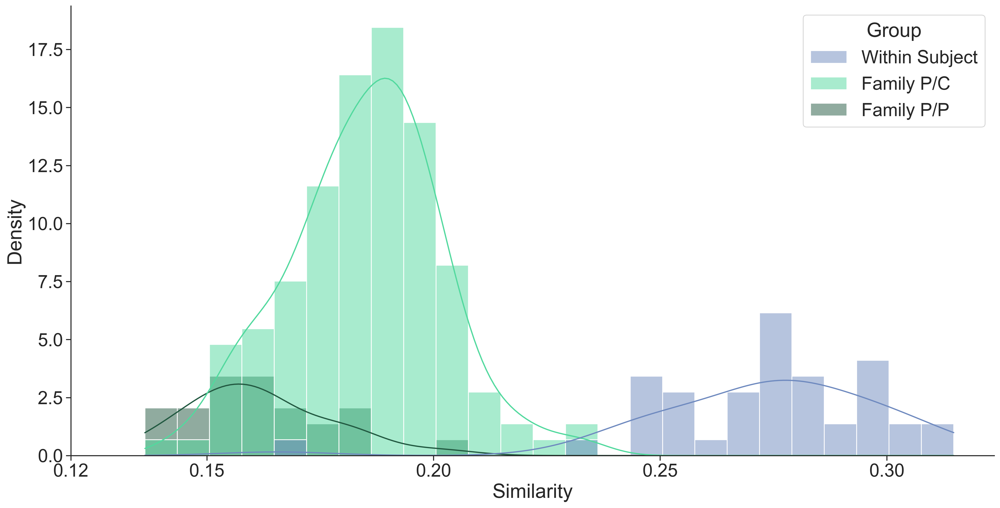

In [318]:
## B: Let's plot the group comparison
plt.figure(figsize=(20,10),dpi=300)
h = sns.histplot(data=group_comparison_family_only,x='Similarity',hue='Group',bins=25,common_norm=True,
             stat='density',multiple='layer',kde=True,
           palette=[within_color,family_parent_child_color,family_parent_parent_color])
h.set(xticks=[0.12,0.15,0.2,0.25,0.3])

sns.despine()

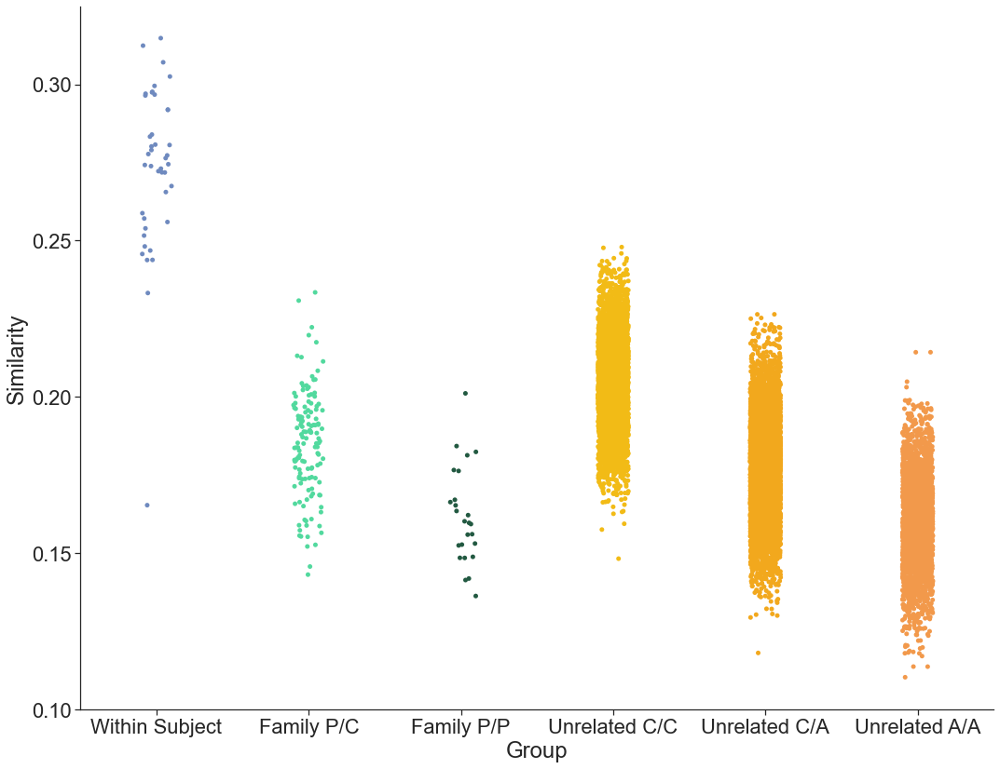

In [305]:
g = sns.catplot(data=group_comparison_clean,x='Group',y='Similarity',kind='strip',
            order=['Within Subject','Family P/C','Family P/P','Unrelated C/C','Unrelated C/A',
                   'Unrelated A/A'],height=12,aspect=1.3,
           palette=[within_color,family_parent_child_color,family_parent_parent_color,child_child_color,child_adult_color,adult_adult_color])
g.set(yticks=[0.1,0.15,0.2,0.25,0.3])
sns.despine()

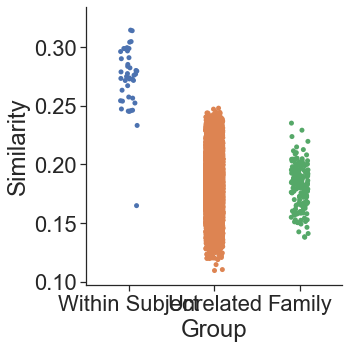

In [257]:
sns.relplot(data=group_comparison_family_vs_unrelated, x='Group',y='Similarity')

### ANOVA 

#### Homogeneity of variance test

In [62]:
pg.homoscedasticity(data=group_comparison_clean, dv='Similarity', group='Group')

,W,pval,equal_var
levene,5.651088,0.000033,False


The classic ANOVA is very powerful when the groups are normally distributed and have equal variances. However, **when the groups have unequal variances, it is best to use the Welch ANOVA** (pingouin.welch_anova()) that better controls for type I error (Liu 2015).

In [65]:
# See: https://pingouin-stats.org
aov = pg.welch_anova(data=group_comparison_clean, dv='Similarity', between='Group')
print(aov)

  Source  ddof1       ddof2            F          p-unc       np2
0  Group      5  158.857439  3426.056612  8.971305e-160  0.562506


When the groups are balanced and have equal variances, the optimal post-hoc test is the Tukey-HSD test (pingouin.pairwise_tukey()). If the groups have **unequal variances, the Games-Howell test** is more adequate (pingouin.pairwise_gameshowell()).

#### Games-Howell

In [82]:
# FDR-corrected post hocs with Hedges'g effect size
posthocs = pg.pairwise_gameshowell(data=group_comparison_clean, dv='Similarity', between='Group',
                             effsize='cohen')

posthocs.round(3)

,A,B,mean(A),mean(B),diff,se,T,df,pval,cohen
0,Family P/C,Family P/P,0.185,0.162,0.023,0.003,6.909,35.068,0.001,1.502
1,Family P/C,Unrelated A/A,0.185,0.160,0.025,0.001,17.355,147.870,0.001,1.513
2,Family P/C,Unrelated C/A,0.185,0.178,0.007,0.001,4.739,141.458,0.001,0.407
3,Family P/C,Unrelated C/C,0.185,0.205,-0.020,0.001,-13.734,143.939,0.001,-1.188
4,Family P/C,Within Subject,0.185,0.273,-0.088,0.004,-20.392,51.293,0.001,-3.594
5,Family P/P,Unrelated A/A,0.162,0.160,0.002,0.003,0.562,24.401,0.900,0.113
6,Family P/P,Unrelated C/A,0.162,0.178,-0.017,0.003,-5.394,24.166,0.001,-1.081
7,Family P/P,Unrelated C/C,0.162,0.205,-0.043,0.003,-14.001,24.257,0.001,-2.809
8,Family P/P,Within Subject,0.162,0.273,-0.111,0.005,-21.828,64.983,0.001,-5.514
9,Unrelated A/A,Unrelated C/A,0.160,0.178,-0.018,0.000,-55.011,5276.184,0.001,-1.230


#### No for the more general Hypothesis 2 family vs unrelated

In [85]:
# See: https://pingouin-stats.org
aov = pg.welch_anova(data=group_comparison_family_vs_unrelated, dv='Similarity', between='Group')
print(aov)

# FDR-corrected post hocs with Hedges'g effect size
posthocs = pg.pairwise_gameshowell(data=group_comparison_family_vs_unrelated, dv='Similarity', between='Group',
                                   effsize='cohen')

posthocs.round(3)

  Source  ddof1      ddof2           F         p-unc       np2
0  Group      2  88.113535  244.852336  1.039195e-36  0.048777


,A,B,mean(A),mean(B),diff,se,T,df,pval,cohen
0,Family,Unrelated,0.181,0.182,-0.001,0.001,-0.691,167.417,0.749,-0.054
1,Family,Within Subject,0.181,0.273,-0.092,0.004,-21.176,51.753,0.001,-3.664
2,Unrelated,Within Subject,0.182,0.273,-0.091,0.004,-22.198,41.171,0.001,-3.430


___

# 4) Inter-subject variability

___

Intersubject variance (ISV) per region was defined as the
average cosine distance between structural/functional connectivities across subjects. We further grouped ROIs
into clusters to compare multimodal ISV.

- use cosine distance (CD) 
- see: https://cmry.github.io/notes/euclidean-v-cosine

- Latex use: https://nbviewer.jupyter.org/github/twistedhardware/mltutorial/blob/master/notebooks/jupyter/2.%20Markdown%20%26%20LaTeX.ipynb


Eucledian distance (d) and Cosine similarity (distance) O
$$
\frac{(x \cdot y)}{(x \cdot x)*(y \cdot y)}
$$

- prep data to run through every child with 2 scan sessions (1 year apart)
- Calculate ISV across the whole functional connectome (400x400)

**Resources**
- https://datascience.stackexchange.com/questions/644/create-most-average-cosine-similarity-observation

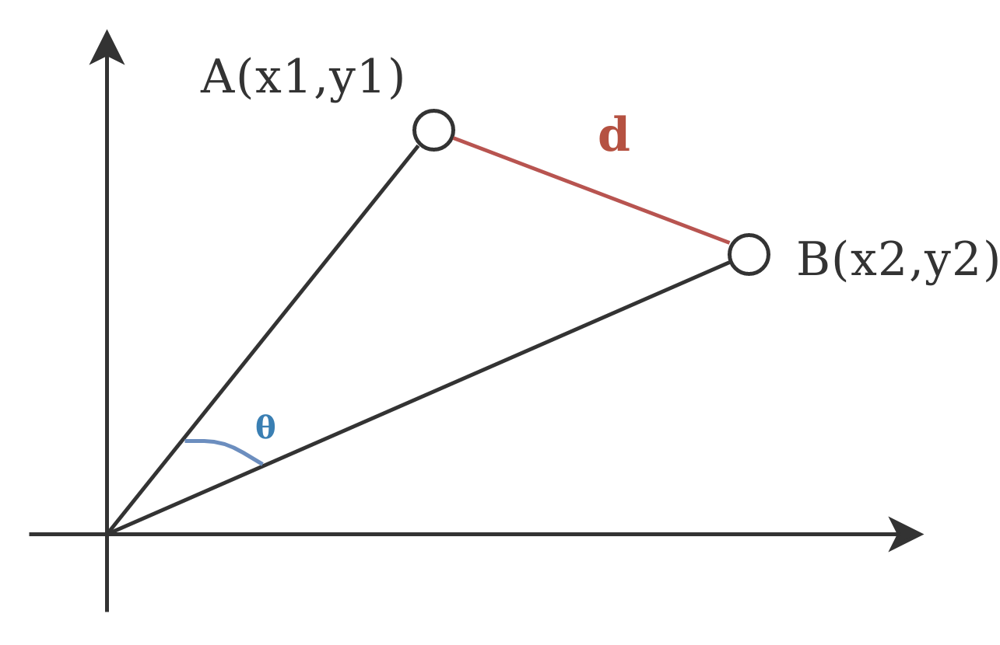

In [37]:
Image('https://cmry.github.io/sources/eucos.png')

## 4.1) Intra-subject variability T1-T2 (children only)

In [ ]:
def cosine_similarity(x, y):
    return np.dot(x, y) / (np.sqrt(np.dot(x, x)) * np.sqrt(np.dot(y, y)))

children_connectomes = correlation_matrix[0:125]
adults_connectomes = correlation_matrix[63]

sub1_connectome_var = abs(cosine_similarity(children_connectomes,adults_connectomes))

plt.figure(figsize=(12,9))
sns.heatmap(sub1_connectome_var,cmap=cmap,vmin=0,vmax=1.25)

In [59]:
predict_final

,Subject,Target2,Similarity,Group,subject_age,age_diff,fd_avg,personality_diff,H_diff,E_diff,X_diff,A_diff,C_diff,O_diff
0,BL065-1,BL065-1,1.000000,Within Subject,16.8,0.0,0.120,0.000000,0.00,0.0000,0.000,0.0,0.00,0.000
1,BL065-1,BL065-2,0.302492,Within Subject,16.8,1.0,0.110,0.000000,0.00,0.0000,0.000,0.0,0.00,0.000
2,BL065-1,BL067-1,0.204673,Unrelated C/C,16.8,0.1,0.115,0.583333,1.10,0.2000,1.000,0.2,0.30,0.700
3,BL065-1,BL067-2,0.225204,Unrelated C/C,16.8,1.1,0.140,0.583333,1.10,0.2000,1.000,0.2,0.30,0.700
4,BL065-1,BL073-1,0.209544,Unrelated C/C,16.8,2.6,0.110,0.550000,1.10,0.3000,0.000,0.7,0.40,0.800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14024,BL2121-1,BL2171-1,0.136537,Unrelated A/A,40.0,3.0,0.110,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14025,BL2121-1,BL2172-1,0.140614,Unrelated A/A,40.0,2.0,0.140,0.427083,0.25,0.8125,0.375,0.5,0.25,0.375
14026,BL2141-1,BL2171-1,0.156387,Unrelated A/A,48.0,11.0,0.155,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14027,BL2141-1,BL2172-1,0.145188,Unrelated A/A,48.0,10.0,0.185,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [62]:
# df["SCORE"] = df['SCORE'].round().astype(int)
predict_final_only_age_matched = predict_final
predict_final_only_age_matched['age_diff'] = predict_final['age_diff'].round().astype(int)
predict_final_only_age_matched

,Subject,Target2,Similarity,Group,subject_age,age_diff,fd_avg,personality_diff,H_diff,E_diff,X_diff,A_diff,C_diff,O_diff
0,BL065-1,BL065-1,1.000000,Within Subject,16.8,0,0.120,0.000000,0.00,0.0000,0.000,0.0,0.00,0.000
1,BL065-1,BL065-2,0.302492,Within Subject,16.8,1,0.110,0.000000,0.00,0.0000,0.000,0.0,0.00,0.000
2,BL065-1,BL067-1,0.204673,Unrelated C/C,16.8,0,0.115,0.583333,1.10,0.2000,1.000,0.2,0.30,0.700
3,BL065-1,BL067-2,0.225204,Unrelated C/C,16.8,1,0.140,0.583333,1.10,0.2000,1.000,0.2,0.30,0.700
4,BL065-1,BL073-1,0.209544,Unrelated C/C,16.8,3,0.110,0.550000,1.10,0.3000,0.000,0.7,0.40,0.800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14024,BL2121-1,BL2171-1,0.136537,Unrelated A/A,40.0,3,0.110,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14025,BL2121-1,BL2172-1,0.140614,Unrelated A/A,40.0,2,0.140,0.427083,0.25,0.8125,0.375,0.5,0.25,0.375
14026,BL2141-1,BL2171-1,0.156387,Unrelated A/A,48.0,11,0.155,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14027,BL2141-1,BL2172-1,0.145188,Unrelated A/A,48.0,10,0.185,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [335]:
predict_final_only_age_matched = predict_final_only_age_matched[predict_final_only_age_matched.Group != 'Within Subject']
predict_final_only_age_matched = predict_final_only_age_matched[predict_final_only_age_matched.age_diff == 0]
predict_final_only_age_matched = predict_final_only_age_matched[predict_final_only_age_matched.Group != 'Family P/P']
predict_final_only_age_matched

,Subject,Target2,Similarity,Group,subject_age,age_diff,fd_avg,personality_diff,H_diff,E_diff,X_diff,A_diff,C_diff,O_diff
2,BL065-1,BL067-1,0.204673,Unrelated C/C,16.8,0,0.115,0.583333,1.1000,0.2000,1.0000,0.2000,0.3000,0.7000
6,BL065-1,BL077-1,0.211994,Unrelated C/C,16.8,0,0.105,0.583333,1.3000,0.2000,0.7000,0.9000,0.0000,0.4000
8,BL065-1,BL081-1,0.216184,Unrelated C/C,16.8,0,0.105,1.050000,2.1000,1.2000,1.1000,0.3000,0.4000,1.2000
10,BL065-1,BL082-1,0.206095,Unrelated C/C,16.8,0,0.095,0.666667,1.8000,0.9000,0.8000,0.3000,0.1000,0.1000
25,BL065-1,BL096-1,0.235326,Unrelated C/C,16.8,0,0.100,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13912,BL1881-1,BL1982-1,0.155838,Unrelated A/A,41.0,0,0.080,0.510417,1.4375,0.0000,0.7500,0.3750,0.3750,0.1250
13943,BL1922-1,BL2062-1,0.165644,Unrelated A/A,39.0,0,0.075,0.687500,0.7500,0.8750,0.5625,0.1250,1.1875,0.6250
13986,BL2032-1,BL2092-1,0.157192,Unrelated A/A,55.0,0,0.120,0.500000,0.2500,0.3125,0.6250,0.8125,0.7500,0.2500
13988,BL2032-1,BL2102-1,0.147681,Unrelated A/A,55.0,0,0.090,0.468750,0.3125,0.5000,0.2500,0.3750,0.8125,0.5625


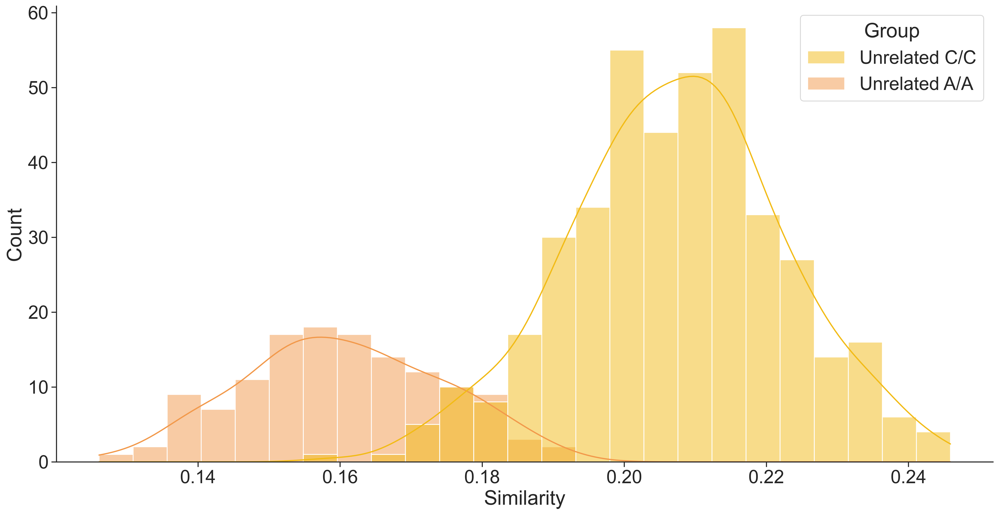

In [337]:
plt.figure(figsize=(20,10),dpi=300)
sns.histplot(data=predict_final_only_age_matched, 
             x='Similarity',
             hue='Group',
             bins=25,
             kde='True',
             palette=[child_child_color,adult_adult_color]
            )
sns.despine()

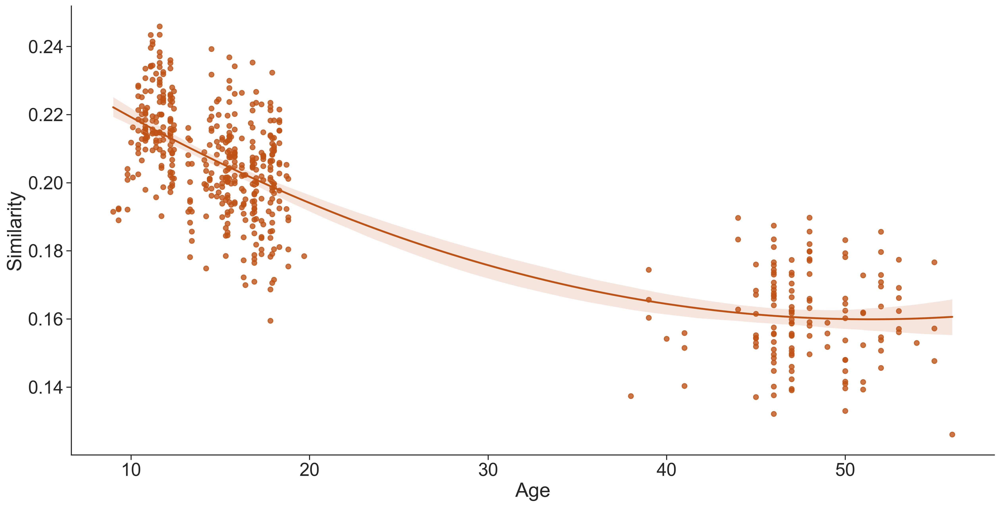

In [329]:
plt.figure(figsize=(20,10),dpi=300)
j = sns.regplot(data=predict_final_only_age_matched,
           x='subject_age',
           y='Similarity',
           order=2,
           color=main_regression_color)
j.set(xlabel='Age')
sns.despine()

In [83]:
pg.corr(predict_final_only_age_matched['Similarity'],
        predict_final_only_age_matched['subject_age'],
        method='pearson').round(3)

,n,r,CI95%,p-val,BF10,power
pearson,552,-0.83,"[-0.85, -0.8]",0.0,7.417e+137,1.0


<Figure size 1500x900 with 0 Axes>

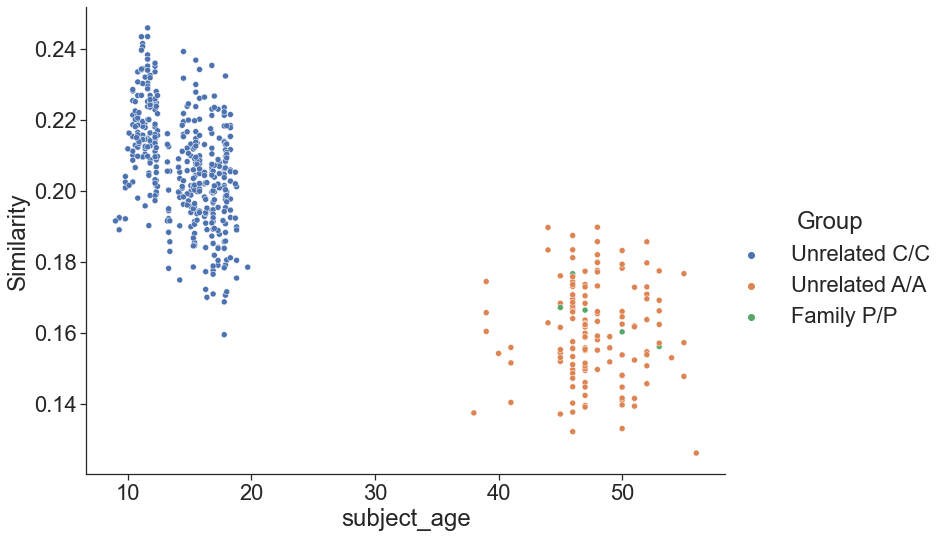

In [76]:
plt.figure(figsize=(10,6),dpi=150)
sns.relplot(data=predict_final_only_age_matched,
           x='subject_age',
           y='Similarity',
           hue='Group',
           height=8,
           aspect=1.36)
sns.despine()

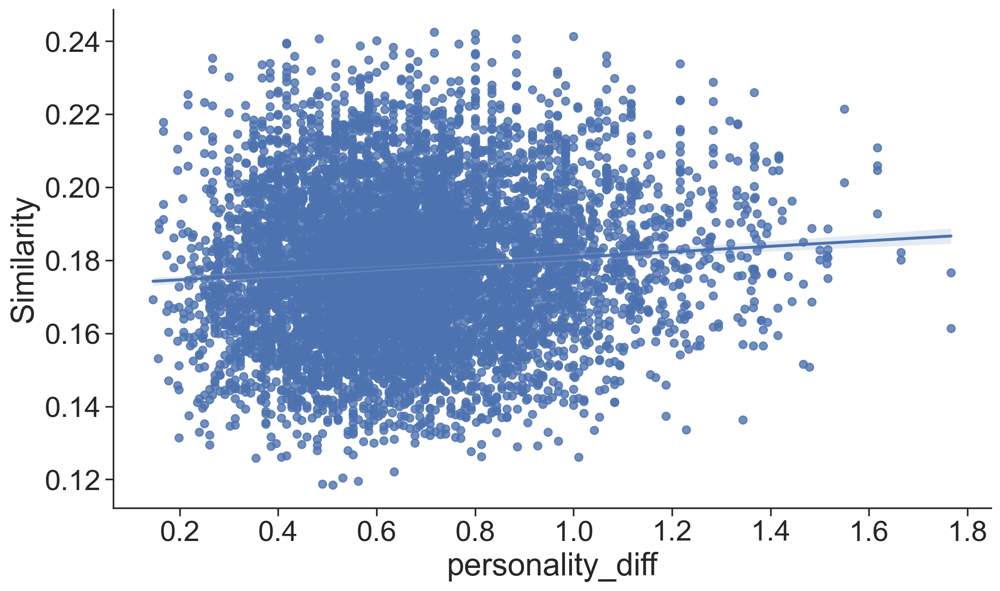

In [105]:
plt.figure(figsize=(12,7),dpi=200)
sns.regplot(data=predict_final_no_within,
           x='personality_diff',
           y='Similarity',
           order=1)
sns.despine()

___

# 5) Classification

___

## Load all packages & prep data

In [343]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score
from sklearn import metrics
import statsmodels.api as sm
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import cross_val_score

from math import sqrt
import ppscore as pps
import warnings
import difflib 
from IPython.display import Image

warnings.filterwarnings('ignore')

## Data prep and clean

In [344]:
## Let's create a function that fills every row with the correct ages & age difference
covariates = pd.read_csv('/Users/philipb/surfdrive/PhD/BRAINLINKS/T1_Ouderstudie/Covariates_T1_ouder.csv')
group_comparison_clean = pd.read_csv('group_comparison.csv')
connectomes_classifier = pd.read_csv('ML_connectome_classifier.csv')

group_comparison_clean

,Unnamed: 0,Subject,Target,Similarity,Group
0,1,BL065-1,BL065-2,0.302492,Within Subject
1,2,BL065-1,BL067-1,0.204673,Unrelated C/C
2,3,BL065-1,BL067-2,0.225204,Unrelated C/C
3,4,BL065-1,BL073-1,0.209544,Unrelated C/C
4,5,BL065-1,BL076-1,0.221483,Unrelated C/C
...,...,...,...,...,...
14023,27718,BL2121-1,BL2171-1,0.136537,Unrelated A/A
14024,27719,BL2121-1,BL2172-1,0.140614,Unrelated A/A
14025,27886,BL2141-1,BL2171-1,0.156387,Unrelated A/A
14026,27887,BL2141-1,BL2172-1,0.145188,Unrelated A/A


In [345]:
# Combine subject and their covariates (age, motion, personality)
group_comparison_clean['Subject'] = group_comparison_clean['Subject'].map(lambda x: difflib.get_close_matches(x, covariates['subject'])[0])
subject_merged = group_comparison_clean.merge(covariates, left_on = 'Subject', right_on = 'subject', how = 'outer').drop('subject', axis = 1)
subject_merged.rename(columns={"age":"subject_age","fd_motion":"subject_fd_motion","H":"H1","E":"E1","X":"X1","A":"A1","C":"C1","O":"O1"},inplace=True)

subject_merged.to_csv('subject_merged.csv')

# Now we do the same with the target participant
group_comparison_clean['Target'] = group_comparison_clean['Target'].map(lambda x: difflib.get_close_matches(x, covariates['subject'])[0])
target_merged = group_comparison_clean.merge(covariates, left_on = 'Target', right_on = 'subject', how = 'outer').drop('subject', axis = 1)
target_merged.rename(columns={"Subject":"Subject2","Target":"Target2","Group":"Group2","age":"target_age","fd_motion":"target_fd_motion","H":"H2","E":"E2","X":"X2","A":"A2","C":"C2","O":"O2"},inplace=True)

target_merged.to_csv('target_merged.csv')

In [346]:
#Pandas merge: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.merge.html
# see also: https://towardsdatascience.com/why-and-how-to-use-merge-with-pandas-in-python-548600f7e738

# Now we merge the two DataFrames
predict_final = pd.merge(subject_merged,target_merged, on='Similarity',how = 'inner',
                         indicator=False).drop(['Subject2','Target','Group2'],axis=1)

# We add additional variables based on the difference of subject and target (age, personality, and movement)
predict_final = predict_final.assign(age_diff = abs(predict_final['subject_age'] - predict_final['target_age']))
predict_final = predict_final.assign(H_diff = abs(predict_final['H1'] - predict_final['H2']))
predict_final = predict_final.assign(E_diff = abs(predict_final['E1'] - predict_final['E2']))
predict_final = predict_final.assign(X_diff = abs(predict_final['X1'] - predict_final['X2']))
predict_final = predict_final.assign(A_diff = abs(predict_final['A1'] - predict_final['A2']))
predict_final = predict_final.assign(C_diff = abs(predict_final['C1'] - predict_final['C2']))
predict_final = predict_final.assign(O_diff = abs(predict_final['O1'] - predict_final['O2']))
predict_final = predict_final.assign(fd_diff = abs(predict_final['target_fd_motion'] - predict_final['subject_fd_motion']))
predict_final['personality_diff'] = predict_final[['H_diff','E_diff','X_diff','A_diff','C_diff','O_diff']].mean(axis=1)
predict_final['fd_avg'] = predict_final[['target_fd_motion','subject_fd_motion']].mean(axis=1)

# 'H1','H2','E1','E2','X1','X2','A1','A2','C1','C2','O1','O2'
# We clean the dataset and drop unnecessary columns like individual personality traits and empty rows
predict_final.drop(['age_diff','fd_diff','fd_avg','H_diff','E_diff','X_diff','A_diff','C_diff','O_diff',
                   ],axis=1,inplace=True)

predict_final = predict_final[['Subject','Target2','Similarity','Group','subject_age','target_age',
                               'target_fd_motion','subject_fd_motion',
                              'H1','H2','E1','E2','X1','X2','A1','A2','C1','C2','O1','O2']]
predict_final.drop_duplicates(subset='Similarity',keep='first',ignore_index=True)
# predict_final.dropna(axis=0,inplace=True,subset=["Subject","Group","similarity"])

predict_final.to_csv('prediction_final.csv')
predict_final


,Subject,Target2,Similarity,Group,subject_age,target_age,target_fd_motion,subject_fd_motion,H1,H2,E1,E2,X1,X2,A1,A2,C1,C2,O1,O2
0,BL065-1,BL065-2,0.302492,Within Subject,16.8,17.8,0.10,0.12,4.6000,4.6000,2.4000,2.4000,2.300,2.30,2.7000,2.7000,3.4000,3.4000,2.700,2.700
1,BL065-1,BL067-1,0.204673,Unrelated C/C,16.8,16.9,0.11,0.12,4.6000,3.5000,2.4000,2.6000,2.300,3.30,2.7000,2.9000,3.4000,3.1000,2.700,2.000
2,BL065-1,BL067-2,0.225204,Unrelated C/C,16.8,17.9,0.16,0.12,4.6000,3.5000,2.4000,2.6000,2.300,3.30,2.7000,2.9000,3.4000,3.1000,2.700,2.000
3,BL065-1,BL073-1,0.209544,Unrelated C/C,16.8,14.2,0.10,0.12,4.6000,3.5000,2.4000,2.7000,2.300,2.30,2.7000,3.4000,3.4000,3.0000,2.700,3.500
4,BL065-1,BL076-1,0.221483,Unrelated C/C,16.8,17.4,0.08,0.12,4.6000,3.9000,2.4000,3.8000,2.300,3.90,2.7000,2.6000,3.4000,4.1000,2.700,3.300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14024,BL2121-1,BL2172-1,0.140614,Unrelated A/A,40.0,38.0,0.18,0.10,4.4375,4.6875,4.0000,3.1875,2.875,3.25,3.4375,3.9375,4.0625,3.8125,3.250,3.625
14025,BL2141-1,BL2171-1,0.156387,Unrelated A/A,48.0,37.0,0.12,0.19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14026,BL2141-1,BL2172-1,0.145188,Unrelated A/A,48.0,38.0,0.18,0.19,NaN,4.6875,NaN,3.1875,NaN,3.25,NaN,3.9375,NaN,3.8125,NaN,3.625
14027,BL2171-1,BL2172-1,0.152773,Family P/P,37.0,38.0,0.18,0.12,NaN,4.6875,NaN,3.1875,NaN,3.25,NaN,3.9375,NaN,3.8125,NaN,3.625


For the baseline identification approach we will replicate Finn et al. (2015) paper. Every adolescent participant's functional conectome will be correlated with all the others in our sample. If the highest correlation is either the mum or the dad we accept it as a correct classifaction. If any other, non-familial, participant shows the highest correlation with the adolescent the family identification will be considered incorrect.

**Additional exploratory classification**
See if we can classify the different participants into the different relationship groups:
- Within
- Family
- Child-Child
- Child-Adult
- Adult-Adult

**Hypotheses**
- Family classification (E1)
- Parent-child dyads > Parent-parent dyads?

In [113]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

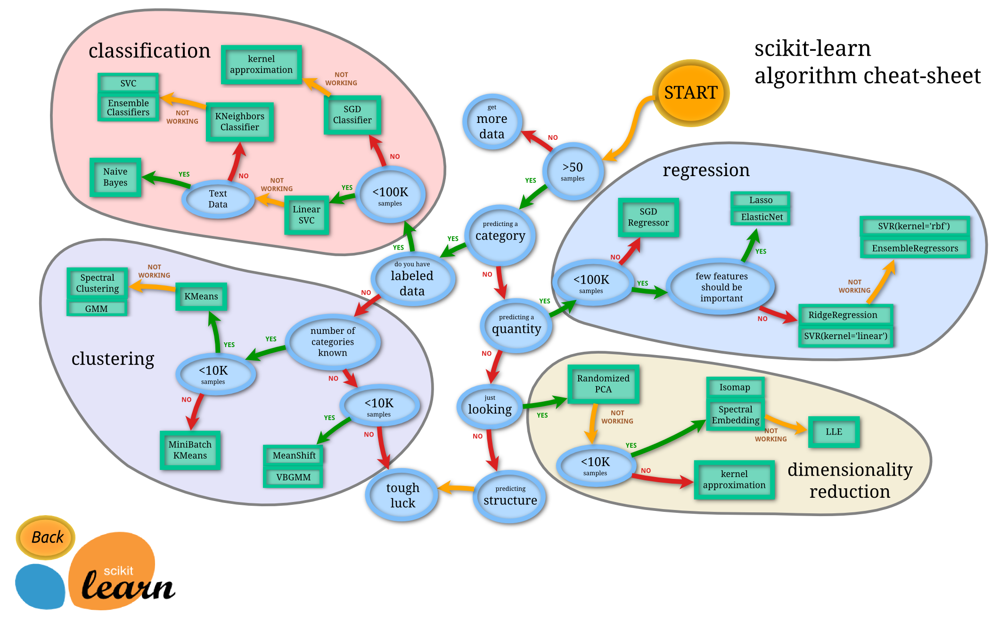

In [32]:
Image('https://scikit-learn.org/stable/_static/ml_map.png')

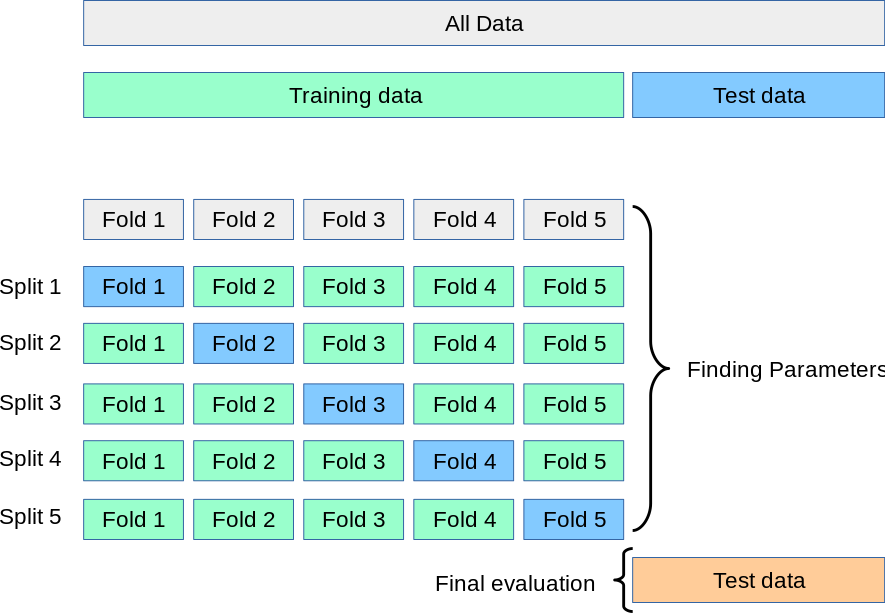

In [33]:
Image('https://scikit-learn.org/stable/_images/grid_search_cross_validation.png')

In [ ]:
Image('https://miro.medium.com/max/1200/1*FoOt85zXNCaNFzpEj7ucuA.png')

## Explore data

In [92]:
pg.corr(predict_final['Similarity'],predict_final['personality_diff'],method='spearman').round(3)

,n,r,CI95%,p-val,power
spearman,7503,0.066,"[0.04, 0.09]",0.0,1.0


## Feature selection

**160,000/2** features are too many. We need to cut this down to a more managable number so we can run more intensive models (like Polynomial regression for age later).

**Resources**
- https://towardsdatascience.com/how-to-use-variance-thresholding-for-robust-feature-selection-a4503f2b5c3f
- https://chrisalbon.com/machine_learning/feature_selection/variance_thresholding_for_feature_selection/
- https://chrisalbon.com/machine_learning/feature_selection/anova_f-value_for_feature_selection/
- https://chrisalbon.com/machine_learning/feature_selection/drop_highly_correlated_features/


**Options**
- High Variance thresholding: DIDN'T WORK none of the features have enough variance??
- ANOVA F-value selection
- Drop highly correlated features


**High Variance thresholding**

In [96]:
# First we create a feature thresholder object
connectome_thresholder = VarianceThreshold(threshold=0.0001)
print('Number of features raw full connectivity matrix: ',family_classifier.shape[0])

# Conduct the variance thresholding by transforming the data
connectomes_high_variance = connectome_thresholder.fit_transform(family_classifier)
print('Number of features after thresholding: ',connectomes_high_variance.shape[0])

Number of features raw full connectivity matrix:  79800
Number of features after thresholding:  79800


**ANOVA f-value selection**

In [101]:
np.savetxt('famly_classifier_test.csv',family_classifier,delimiter=',')

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

print(family_classifier.shape)
print(y_age_final.shape)

# Create f-value selector object
fvalue_selector = SelectKBest(f_classif,k=2)

# Apply the kbest selector to our features and target value (different for every problem)
X_age_kbest = fvalue_selector.fit_transform(family_classifier,y_age_final)

# Show results
print('Original number of features: ',family_classifier.shape[0])
print('Reduced number of features: ', X_age_kbest.shape[0])

**Delete high correlating features**

In [ ]:
df_family_classifier = pd.DataFrame(family_classifier)
df_family_classifier
# connectome_classifier_corr = df_family_classifier.corr().abs()

## 5.1) Classification of Family Identity

### Data prep and data split

In [289]:
# We start with the subject id's and family list of our sample -- 51 families in total

family_ids = [65,65,67,67,73,76,77,77,81,81,82,82,84,84,86,86,87,87,88,88,89,89,90,92,92,96,96,102,102,104,
              111,111,113,113,115,117,117,122,122,127,127,131,131,134,134,135,135,138,138,140,140,142,142,
              143,143,154,154,155,155,156,156,160,160,161,161,163,163,169,169,177,177,182,182,185,185,188,188,
              192,192,198,198,203,203,206,206,209,210,212,212,214,214,217,65,65,67,73,76,77,77,81,82,82,84,86,
              87,88,88,89,90,92,92,96,102,104,111,111,113,114,114,115,117,117,122,122,127,131,131,134,135,135,
              138,138,140,142,143,143,154,154,155,156,156,160,161,161,163,163,169,169,177,182,182,185,188,192,
              192,198,198,203,203,206,206,209,210,210,212,214,217,217          
             ]

family_labels = np.array([family_ids])
family_labels = family_labels.T
family_classifier = connectomes_classifier.T

In [290]:
# Here we have our 1-dimensional array representing our vectorized functional connectome (400x400 = 160,000)

print(family_classifier.shape)
print(family_labels.shape)
print(len(family_classifier) == len(family_labels))

(168, 79799)
(168, 1)
True


In [291]:
# Get the features and labels (indepdendent & outcome variable)
X_rfc = family_classifier
y_rfc = family_labels

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X_rfc, y_rfc, test_size=0.2) # 80% training and 30% test

print('Shape of X-train: ',X_train.shape)
print('Shape of X-test: ',X_test.shape)
print('Shape of Y-train: ',y_train.shape)
print('Shape of Y-test: ',y_test.shape)

Shape of X-train:  (134, 79799)
Shape of X-test:  (34, 79799)
Shape of Y-train:  (134, 1)
Shape of Y-test:  (34, 1)


### Cross validation and tuning

In [292]:
# Setting up the K-fold attributes for cross-validation of my models below
kf = KFold(n_splits=5, shuffle=True, random_state=1)

In [295]:
# Create the models that we want to test
model_rfr_family = RandomForestClassifier(random_state=42)


# Run the Cross-Validation comparison with the models used in this analysis
cross_val_score(model_rfr_family,X_train,y_train,cv=kf)

array([0.03703704, 0.        , 0.03703704, 0.03703704, 0.        ])

### Final Evaluation on TEST set

In [296]:
# Initialize the random forest classifier & fit the model to the training dataset
# Bootstrap = bagging or sampling with replacement for the indivdual trees
rf_classy = RandomForestClassifier(n_estimators=100,bootstrap=True,n_jobs=-1)
rf_classy.fit(X_train,y_train)

# Now let's predict our X_test set groups
rf_classy_y_pred = rf_classy.predict(X_test)

print('ACCURACY RFC (test): ',metrics.accuracy_score(y_test,rf_classy_y_pred))
print('PRECISION RFC (test): ',metrics.precision_score(y_test,rf_classy_y_pred,average="weighted"))

ACCURACY RFC (test):  0.0
PRECISION RFC (test):  0.0


## 5.2) Classification of Adolescent vs Adult

### Data prep + split

In [297]:
# We start with the labels for child (1) vs adult (0)

child_ids = [1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,
             1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,
             0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
             0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0       
             ]


child_labels = np.array([child_ids])
child_labels = child_labels.T

In [298]:
print(family_classifier.shape)
print(child_labels.shape)
print(len(family_classifier) == len(child_labels))

(168, 79799)
(168, 1)
True


In [299]:
# Get the features and labels (indepdendent & outcome variable)
X_rfc = family_classifier
y_rfc = child_labels

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X_rfc, y_rfc, test_size=0.2) # 80% training and 20% test
print('Shape of X-train: ',X_train.shape)
print('Shape of X-test: ',X_test.shape)
print('Shape of Y-train: ',y_train.shape)
print('Shape of Y-test: ',y_test.shape)

Shape of X-train:  (134, 79799)
Shape of X-test:  (34, 79799)
Shape of Y-train:  (134, 1)
Shape of Y-test:  (34, 1)


### Cross validation + hyper-parameter tuning

In [301]:
# Create the models that we want to test
model_svm_child = svm.SVC()
model_rfc_child = RandomForestClassifier(random_state=42)

# Run the Cross-Validation comparison with the models used in this analysis
print('Scores for SVM',cross_val_score(model_svm_child,X_train,y_train,cv=kf))
print('Score for RFC: ',cross_val_score(model_rfc_child,X_train,y_train,cv=kf))

Scores for SVM [0.48148148 0.25925926 0.48148148 0.40740741 0.5       ]
Score for RFC:  [0.7037037  0.48148148 0.59259259 0.48148148 0.69230769]


#### Random grid search SVM

In [310]:
# C Regularization parameter
C = [int(x) for x in np.linspace(start = 1, stop = 30, num = 3)]

# kernel
kernel = ['linear', 'poly', 'rfb']

# gamma for kernel linear and rfb
gamma = ['scale', 'auto']

# Create the random grid
random_grid_child_svm = {
                'C': C,
               'kernel': kernel,
               'gamma': gamma,
               }
print(random_grid_child_rfr)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [311]:
# Initializing random forest model and fitting the training data to the model
model_svm_child = svm.SVC()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
model_svm_child_random = RandomizedSearchCV(estimator=model_svm_child,
                                     param_distributions=random_grid_child_svm,
                                     n_iter=500, # number of iterations/candidates
                                     cv=3, # number of k-folds
                                     verbose=2,
                                     random_state=42,
                                     n_jobs=-1)

# Fit the random search model
model_svm_child_random.fit(X_train,y_train)

# Find the best parameters
best_svm_param_child = model_svm_child_random.best_params_

Fitting 3 folds for each of 18 candidates, totalling 54 fits


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/svm/_base.py", line 226, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "/Library/Fra

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py"

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/svm/_base.py", line 226, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)
  File "/Library/Fra

In [312]:
model_svm_child_random.best_params_

{'kernel': 'linear', 'gamma': 'scale', 'C': 1}

#### Random grid search RFR

In [303]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid_child_rfr = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid_child_rfr)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [304]:
# Initializing random forest model and fitting the training data to the model
model_rfc_child = RandomForestClassifier()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
model_rfc_child_random = RandomizedSearchCV(estimator=model_rfc_child,
                                     param_distributions=random_grid_child_rfr,
                                     n_iter=50, # number of iterations/candidates
                                     cv=3, # number of k-folds
                                     verbose=2,
                                     random_state=42,
                                     n_jobs=-1)

# Fit the random search model
model_rfc_child_random.fit(X_train,y_train)

# Find the best parameters
best_dt_param_similarity = model_rfc_child_random.best_params_

Fitting 3 folds for each of 50 candidates, totalling 150 fits


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Pytho

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Pytho

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Pytho

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Pytho

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Pytho

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Pytho

In [305]:
model_rfc_child_random.best_params_

{'n_estimators': 600,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 70,
 'bootstrap': False}

### Final evaluation in TEST-set

In [307]:
model_rfc_child_FINAL = RandomForestClassifier(
                                n_estimators=600, 
                                 min_samples_split=5, 
                                 min_samples_leaf=2,
                                 max_features='auto',
                                 max_depth=70,
                                 bootstrap=False)

# Train the tuned FINAL Model using ALL of the train set (80%), no k-folds or splits
model_rfc_child_FINAL.fit(X_train,y_train)

RandomForestClassifier(bootstrap=False, max_depth=70, min_samples_leaf=2,
                       min_samples_split=5, n_estimators=600)

In [316]:
model_rfc_child_FINAL_predict = model_rfc_child_FINAL.predict(X_test)
rfc_child_accuracy = metrics.accuracy_score(y_test,model_rfc_child_FINAL_predict)
print('Accuracy Random forest classifier',round(rfc_child_accuracy,3))

Accuracy Random forest classifier 0.971


#### SVM classifier 

In [313]:
model_svm_child_FINAL = svm.SVC(
                                C=1,
                                kernel='linear',
                               gamma='scale')

# Train the tuned FINAL Model using ALL of the train set (80%), no k-folds or splits
model_svm_child_FINAL.fit(X_train,y_train)

SVC(C=1, kernel='linear')

In [317]:
model_svm_child_FINAL_predict = model_svm_child_FINAL.predict(X_test)
svm_child_accuracy = metrics.accuracy_score(y_test,model_svm_child_FINAL_predict)

print('Accuracy Support vector classifier',round(svm_child_accuracy,3))

Accuracy Support vector classifier 0.971


### k-fold Cross-Validation with 3 classifiers

See:
- https://stats.stackexchange.com/questions/339736/perform-cross-validation-on-train-set-or-entire-data-set

___

# 6) Prediction Analysis

___

In this final part of the analyses we will try to predict similarity between functional connectomes of individuals based on a handful of features. Because our outcome variable is numerical (correlation as proxy for similarity) and not a classification (like with the family identity above) we could use one of the following machine-learning methods:

- Linear Regression (baseline model)
- Lasso (?)
- Random forrest
- Neural net

for more choices in ML-methods see: https://scikit-learn.org/stable/tutorial/machine_learning_map/index.html

In [347]:
import sklearn
sklearn.__version__

'0.24.2'

- Don't forget to dummy code the categorical variable for GROUP so the regression model can use it

For details see:
- https://towardsdatascience.com/simple-and-multiple-linear-regression-with-python-c9ab422ec29c
- https://towardsdatascience.com/simple-and-multiple-linear-regression-with-python-c9ab422ec29c


In [127]:
predict_final

,Subject,Target2,Similarity,Group,subject_age,target_age,target_fd_motion,subject_fd_motion,H1,H2,E1,E2,X1,X2,A1,A2,C1,C2,O1,O2
0,BL065-1,BL065-1,1.000000,Within Subject,16.8,16.8,0.12,0.12,4.6000,4.6000,2.4,2.4000,2.300,2.30,2.7000,2.7000,3.4000,3.4000,2.70,2.700
1,BL065-1,BL065-2,0.302492,Within Subject,16.8,17.8,0.10,0.12,4.6000,4.6000,2.4,2.4000,2.300,2.30,2.7000,2.7000,3.4000,3.4000,2.70,2.700
2,BL065-1,BL067-1,0.204673,Unrelated C/C,16.8,16.9,0.11,0.12,4.6000,3.5000,2.4,2.6000,2.300,3.30,2.7000,2.9000,3.4000,3.1000,2.70,2.000
3,BL065-1,BL067-2,0.225204,Unrelated C/C,16.8,17.9,0.16,0.12,4.6000,3.5000,2.4,2.6000,2.300,3.30,2.7000,2.9000,3.4000,3.1000,2.70,2.000
4,BL065-1,BL073-1,0.209544,Unrelated C/C,16.8,14.2,0.10,0.12,4.6000,3.5000,2.4,2.7000,2.300,2.30,2.7000,3.4000,3.4000,3.0000,2.70,3.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14024,BL2121-1,BL2171-1,0.136537,Unrelated A/A,40.0,37.0,0.12,0.10,4.4375,NaN,4.0,NaN,2.875,NaN,3.4375,NaN,4.0625,NaN,3.25,NaN
14025,BL2121-1,BL2172-1,0.140614,Unrelated A/A,40.0,38.0,0.18,0.10,4.4375,4.6875,4.0,3.1875,2.875,3.25,3.4375,3.9375,4.0625,3.8125,3.25,3.625
14026,BL2141-1,BL2171-1,0.156387,Unrelated A/A,48.0,37.0,0.12,0.19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14027,BL2141-1,BL2172-1,0.145188,Unrelated A/A,48.0,38.0,0.18,0.19,NaN,4.6875,NaN,3.1875,NaN,3.25,NaN,3.9375,NaN,3.8125,NaN,3.625


In [128]:
# Create a dataFrame excluding Within subjects
# df = df[df.line_race != 0]
# df['n'].replace({'a': 'x', 'b': 'y', 'c': 'w', 'd': 'z'})

predict_final_no_within = predict_final[predict_final.Group != 'Within Subject']
predict_final_no_within['Group'] = predict_final_no_within['Group'].replace({
                                        'Family P/C': 'Related',
                                        'Family P/P': 'Partner',
                                        'Unrelated C/C': 'Unrelated',
                                        'Unrelated A/A': 'Unrelated',
                                        'Unrelated C/A': 'Unrelated'})

predict_final_no_within

,Subject,Target2,Similarity,Group,subject_age,target_age,target_fd_motion,subject_fd_motion,H1,H2,E1,E2,X1,X2,A1,A2,C1,C2,O1,O2
2,BL065-1,BL067-1,0.204673,Unrelated,16.8,16.9,0.11,0.12,4.6000,3.5000,2.4,2.6000,2.300,3.30,2.7000,2.9000,3.4000,3.1000,2.70,2.000
3,BL065-1,BL067-2,0.225204,Unrelated,16.8,17.9,0.16,0.12,4.6000,3.5000,2.4,2.6000,2.300,3.30,2.7000,2.9000,3.4000,3.1000,2.70,2.000
4,BL065-1,BL073-1,0.209544,Unrelated,16.8,14.2,0.10,0.12,4.6000,3.5000,2.4,2.7000,2.300,2.30,2.7000,3.4000,3.4000,3.0000,2.70,3.500
5,BL065-1,BL076-1,0.221483,Unrelated,16.8,17.4,0.08,0.12,4.6000,3.9000,2.4,3.8000,2.300,3.90,2.7000,2.6000,3.4000,4.1000,2.70,3.300
6,BL065-1,BL077-1,0.211994,Unrelated,16.8,17.3,0.09,0.12,4.6000,3.3000,2.4,2.6000,2.300,3.00,2.7000,3.6000,3.4000,3.4000,2.70,3.100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14024,BL2121-1,BL2171-1,0.136537,Unrelated,40.0,37.0,0.12,0.10,4.4375,NaN,4.0,NaN,2.875,NaN,3.4375,NaN,4.0625,NaN,3.25,NaN
14025,BL2121-1,BL2172-1,0.140614,Unrelated,40.0,38.0,0.18,0.10,4.4375,4.6875,4.0,3.1875,2.875,3.25,3.4375,3.9375,4.0625,3.8125,3.25,3.625
14026,BL2141-1,BL2171-1,0.156387,Unrelated,48.0,37.0,0.12,0.19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14027,BL2141-1,BL2172-1,0.145188,Unrelated,48.0,38.0,0.18,0.19,NaN,4.6875,NaN,3.1875,NaN,3.25,NaN,3.9375,NaN,3.8125,NaN,3.625


In [129]:
predict_final_dummy = pd.get_dummies(predict_final_no_within,columns=['Group'],prefix='group')
predict_final_dummy.dropna(inplace=True,axis=0)
predict_final_dummy

,Subject,Target2,Similarity,subject_age,target_age,target_fd_motion,subject_fd_motion,H1,H2,E1,...,X2,A1,A2,C1,C2,O1,O2,group_Partner,group_Related,group_Unrelated
2,BL065-1,BL067-1,0.204673,16.8,16.9,0.11,0.12,4.6000,3.5000,2.4000,...,3.300,2.7000,2.9000,3.4000,3.1000,2.7000,2.000,0,0,1
3,BL065-1,BL067-2,0.225204,16.8,17.9,0.16,0.12,4.6000,3.5000,2.4000,...,3.300,2.7000,2.9000,3.4000,3.1000,2.7000,2.000,0,0,1
4,BL065-1,BL073-1,0.209544,16.8,14.2,0.10,0.12,4.6000,3.5000,2.4000,...,2.300,2.7000,3.4000,3.4000,3.0000,2.7000,3.500,0,0,1
5,BL065-1,BL076-1,0.221483,16.8,17.4,0.08,0.12,4.6000,3.9000,2.4000,...,3.900,2.7000,2.6000,3.4000,4.1000,2.7000,3.300,0,0,1
6,BL065-1,BL077-1,0.211994,16.8,17.3,0.09,0.12,4.6000,3.3000,2.4000,...,3.000,2.7000,3.6000,3.4000,3.4000,2.7000,3.100,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14015,BL2101-1,BL2121-1,0.132265,51.0,40.0,0.10,0.12,3.3125,4.4375,2.6875,...,2.875,2.8750,3.4375,2.9375,4.0625,3.3125,3.250,0,0,1
14018,BL2101-1,BL2172-1,0.141171,51.0,38.0,0.18,0.12,3.3125,4.6875,2.6875,...,3.250,2.8750,3.9375,2.9375,3.8125,3.3125,3.625,0,0,1
14019,BL2102-1,BL2121-1,0.152512,55.0,40.0,0.10,0.08,3.5625,4.4375,3.8125,...,2.875,2.7500,3.4375,3.8750,4.0625,2.9375,3.250,0,0,1
14022,BL2102-1,BL2172-1,0.154048,55.0,38.0,0.18,0.08,3.5625,4.6875,3.8125,...,3.250,2.7500,3.9375,3.8750,3.8125,2.9375,3.625,0,0,1


### Assumption checks

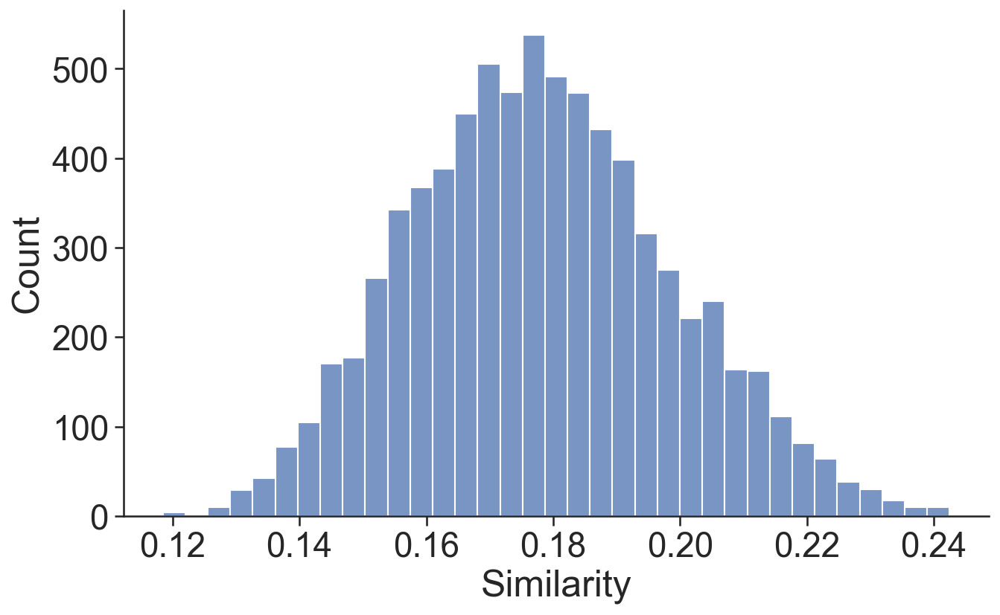

In [131]:
plt.figure(figsize=(10,6),dpi=150)
sns.histplot(data=predict_final_dummy,x='Similarity',bins=35)
sns.despine()

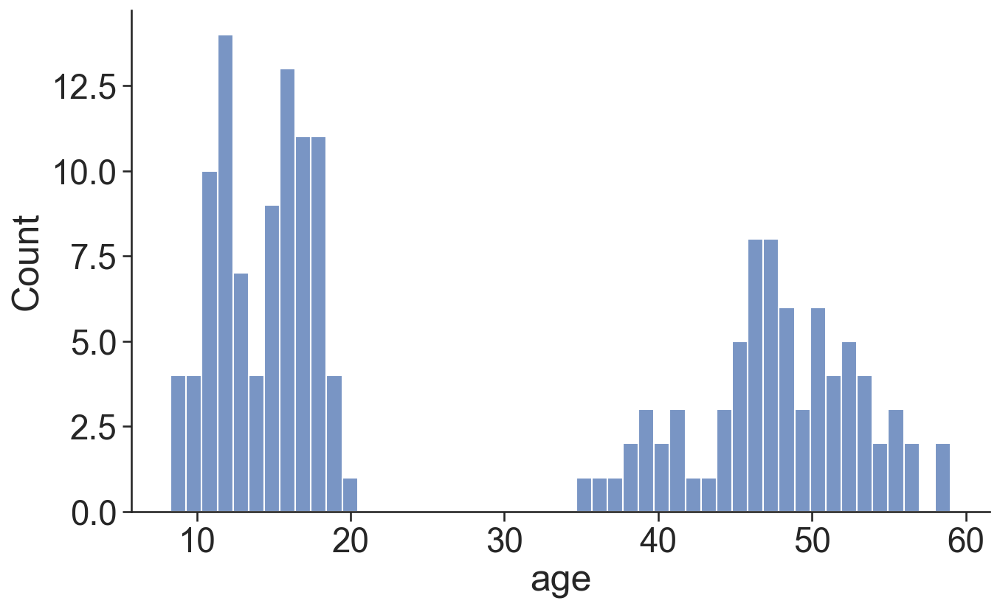

In [385]:
plt.figure(figsize=(10,6),dpi=150)
sns.histplot(data=covariates,
            x='age',
            bins=50)
sns.despine()

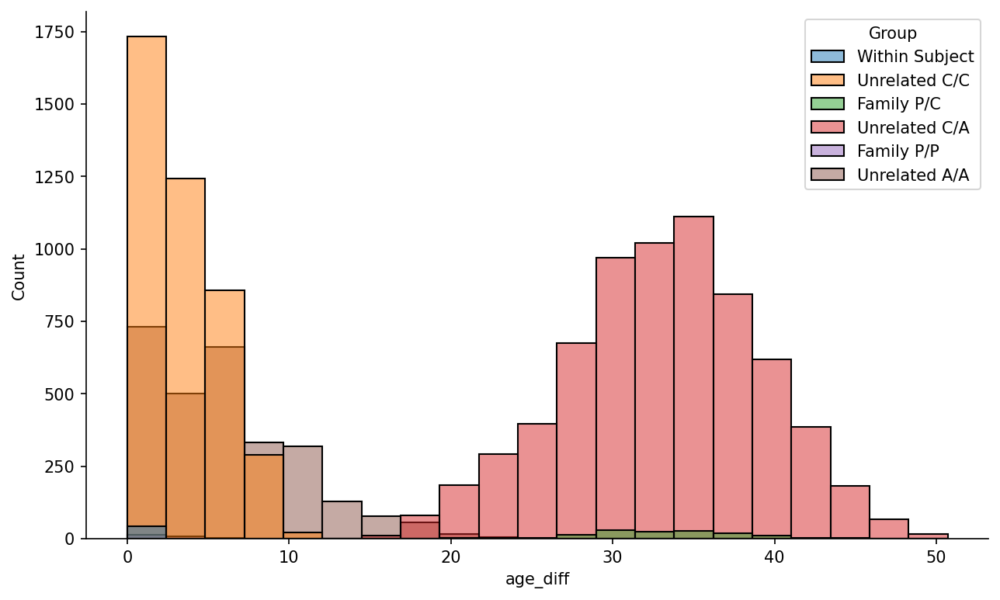

In [368]:
plt.figure(figsize=(10,6),dpi=150)
sns.histplot(data=predict_final,
             x='age_diff',
             hue="Group",
            multiple='layer',
             
            )
sns.despine()

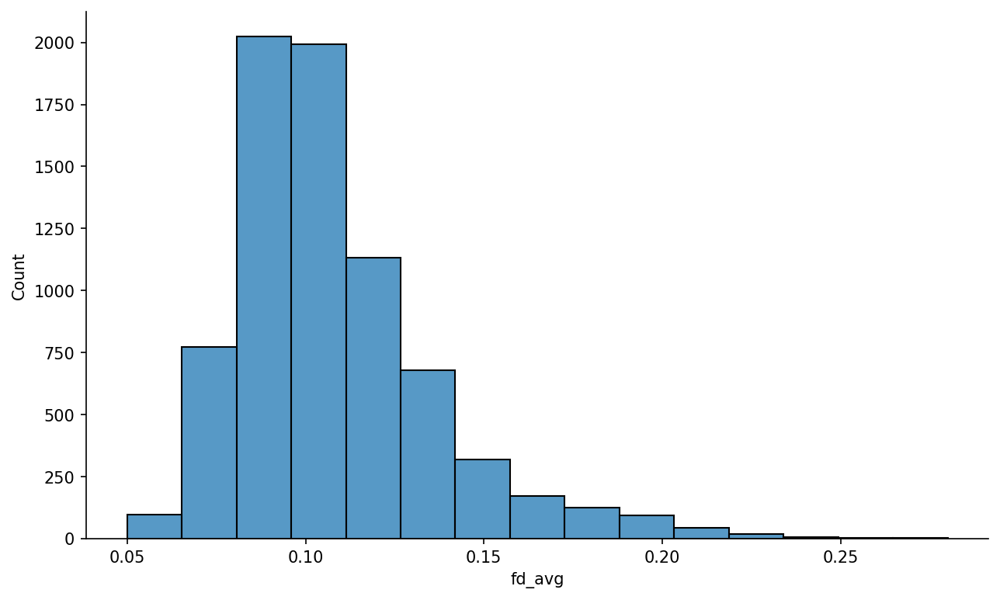

In [338]:
plt.figure(figsize=(10,6),dpi=150)
sns.histplot(data=predict_final_dummy,x='fd_avg',bins=15)
sns.despine()

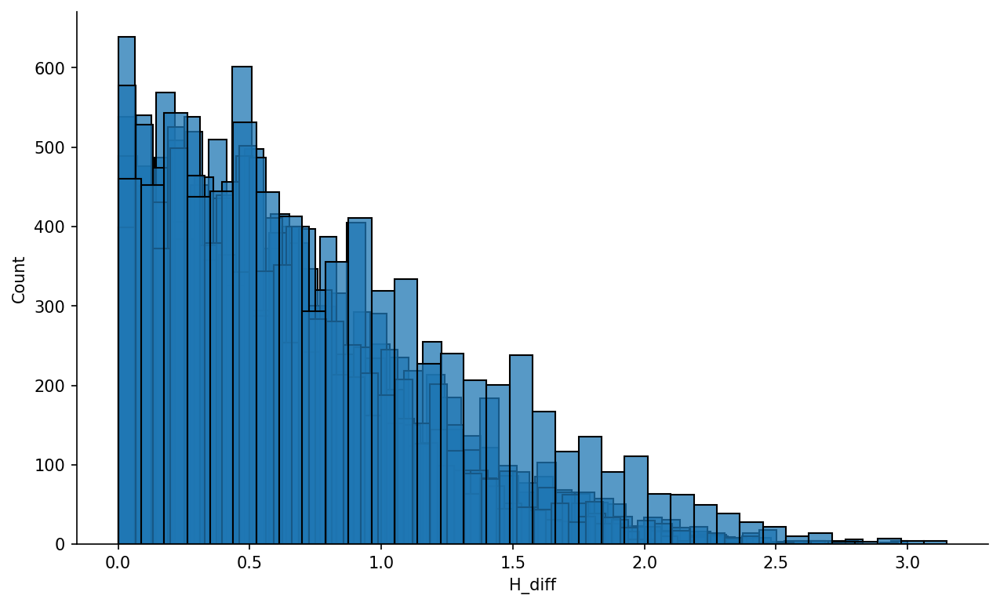

In [334]:
plt.figure(figsize=(10,6),dpi=150)
sns.histplot(data=predict_final_dummy,x='H_diff')
sns.histplot(data=predict_final_dummy,x='E_diff')
sns.histplot(data=predict_final_dummy,x='X_diff')
sns.histplot(data=predict_final_dummy,x='A_diff')
sns.histplot(data=predict_final_dummy,x='C_diff')
sns.histplot(data=predict_final_dummy,x='O_diff')

sns.despine()

In [ ]:
plt.figure(figsize=(10,6),dpi=150)
sns.regplot(data=predict_final,x='subjet_age',y='personality_diff')
sns.despine()

,Similarity,subject_age,target_age,target_fd_motion,subject_fd_motion,H1,H2,E1,E2,X1,X2,A1,A2,C1,C2,O1,O2,group_Partner,group_Related,group_Unrelated
Similarity,1.000000,-0.545673,-0.569904,0.015752,0.012202,-0.105275,-0.221301,0.027156,0.024792,-0.237224,-0.112650,-0.017225,0.055979,-0.207390,-0.106298,-0.280046,-0.192748,-0.040588,0.035773,-0.013111
subject_age,-0.545673,1.000000,0.278257,-0.025217,-0.072349,0.281493,0.086633,-0.115757,0.034453,0.328412,0.087380,-0.039917,-0.045371,0.254889,0.023168,0.393552,0.120878,0.072676,-0.064635,0.023992
target_age,-0.569904,0.278257,1.000000,-0.049413,0.004962,0.050348,0.296887,-0.003256,-0.070589,0.094717,0.275841,-0.016961,-0.045362,0.063275,0.208752,0.125622,0.358261,0.025661,0.057234,-0.062757
target_fd_motion,0.015752,-0.025217,-0.049413,1.000000,-0.008784,-0.004615,-0.016295,0.000595,-0.081795,-0.010604,-0.036242,0.000563,0.047483,-0.010002,-0.051909,-0.016973,-0.023540,0.001164,-0.013507,0.011481
subject_fd_motion,0.012202,-0.072349,0.004962,-0.008784,1.000000,0.034108,-0.001426,-0.142727,0.001603,0.029249,0.003319,-0.061402,0.003260,-0.112642,0.010172,-0.103889,0.008736,-0.009326,0.011438,-0.005876
H1,-0.105275,0.281493,0.050348,-0.004615,0.034108,1.000000,0.005223,-0.158700,0.008869,0.068214,0.016977,0.405514,-0.011062,0.312447,0.004577,0.036410,0.025475,0.011202,-0.018046,0.010890
H2,-0.221301,0.086633,0.296887,-0.016295,-0.001426,0.005223,1.000000,0.000624,-0.039667,0.028194,0.068565,-0.015357,0.367083,0.009694,0.387499,0.037281,-0.004873,0.015189,0.026474,-0.030559
E1,0.027156,-0.115757,-0.003256,0.000595,-0.142727,-0.158700,0.000624,1.000000,-0.010886,0.126507,-0.009545,-0.007429,0.002958,0.240527,-0.004605,0.308386,-0.007196,-0.020873,0.009486,0.001186
E2,0.024792,0.034453,-0.070589,-0.081795,0.001603,0.008869,-0.039667,-0.010886,1.000000,0.017555,0.031233,-0.006151,-0.022367,0.003948,0.004426,0.012862,0.220945,0.018810,-0.015178,0.004830
X1,-0.237224,0.328412,0.094717,-0.010604,0.029249,0.068214,0.028194,0.126507,0.017555,1.000000,0.018909,0.180381,-0.018250,0.333994,0.006094,0.182094,0.046008,0.028090,-0.030131,0.013855


<AxesSubplot:>

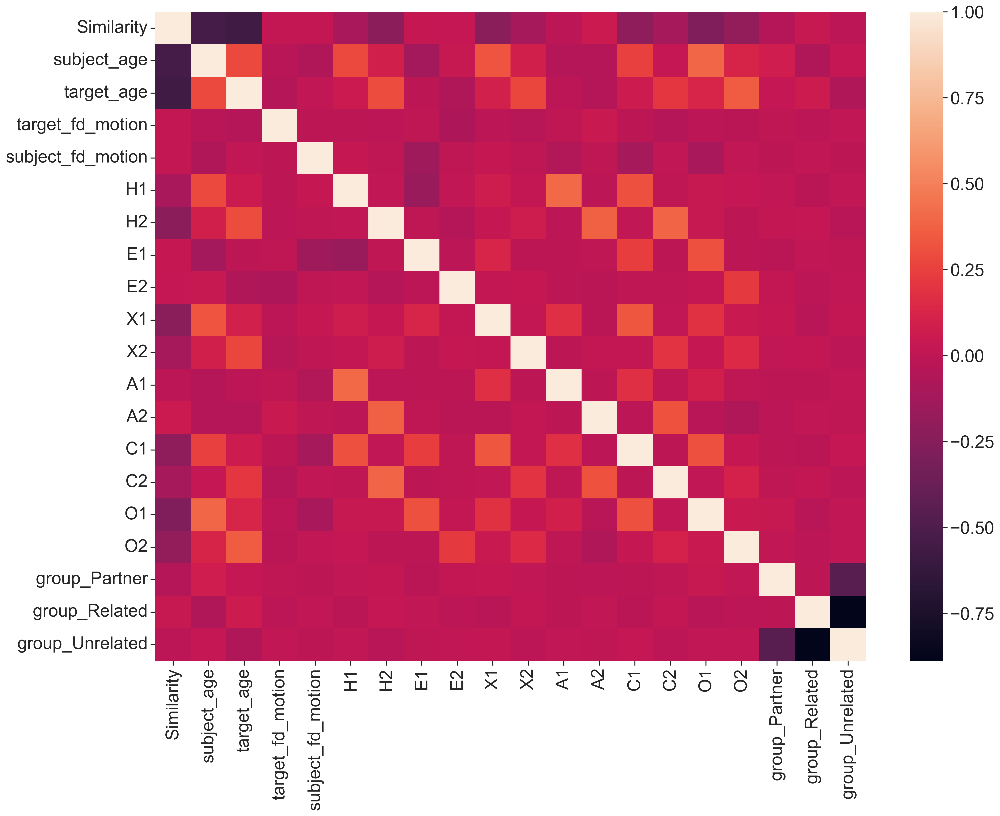

In [ ]:
# Multicollinearity
plt.figure(figsize=(20,15),dpi=300)

# predict_final_dummy.drop(['personality_diff'],axis=1,inplace=True)
multi_corr = predict_final_dummy.corr()
display(multi_corr)
sns.heatmap(multi_corr,)

## We set our variables here

In [178]:
# Let's import sklearn for the regression model


# 1) Let's define our predictors Xs and our outcome variable Y
X_all = predict_final_dummy[['group_Partner','group_Related','group_Unrelated',
                             'subject_age','target_age',
                            'target_fd_motion','subject_fd_motion',
                             'H1','H2','E1','E2','X1','X2','A1','A2','C1','C2','O1','O2']]

X_only_motion = predict_final_dummy[['target_fd_motion','subject_fd_motion']]
X_only_personality = predict_final_dummy[['H1','H2','E1','E2','X1','X2','A1','A2','C1','C2','O1','O2']]
X_only_age = predict_final_dummy[['subject_age','target_age']]
X_only_family = predict_final_dummy[['group_Partner','group_Related','group_Unrelated']]


Y = predict_final_dummy['Similarity']

# 6.1. Predicting Functional Similarity

## 6.1.1 - Split the data into train & test set

We decided to split the train/test set using a 80/20 split.

**All the different predictor combinations:**
- X_all
- X_no_groups 
- X_only_motion
- X_only_personality
- X_only_SINGLE_personality
- X_only_age
- X_only_family

In [348]:
X_predictor_data = X_all

In [349]:
X_train, X_test, y_train, y_test = train_test_split(X_predictor_data,Y,test_size=0.2,
                                                    random_state=50)

print('Shape of X-train: ',X_train.shape)
print('Shape of X-test: ',X_test.shape)
print('Shape of Y-train: ',y_train.shape)
print('Shape of Y-test: ',y_test.shape)

Shape of X-train:  (5982, 19)
Shape of X-test:  (1496, 19)
Shape of Y-train:  (5982,)
Shape of Y-test:  (1496,)


## 6.1.2 Cross-Validation within TRAIN set (tuning)

To see whether the random search Cross-validation provided us with a better tuned model than the base model let's compare the two.

### Introduction to RF

- https://www.datacamp.com/community/tutorials/random-forests-classifier-python
- https://towardsdatascience.com/random-forest-in-python-24d0893d51c0
- https://medium.datadriveninvestor.com/random-forest-regression-9871bc9a25eb
- https://towardsdatascience.com/an-implementation-and-explanation-of-the-random-forest-in-python-77bf308a9b76

### K-fold Cross-Validation (Resources)

- https://scikit-learn.org/stable/modules/cross_validation.html
- https://towardsdatascience.com/cross-validation-and-hyperparameter-tuning-how-to-optimise-your-machine-learning-model-13f005af9d7d

- https://machinelearningmastery.com/k-fold-cross-validation/
- https://machinelearningmastery.com/how-to-configure-k-fold-cross-validation/
- https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

In [350]:
# Setting up the K-fold attributes for cross-validation of my models below
kf = KFold(n_splits=5, shuffle=True, random_state=1)

**Here we are setting up the Regression models and using 5-fold Cross Validation on the TRAIN Set**

In [351]:
# Define a function that compares the CV perfromance of a set of predetrmined models 
cv_accuracies = pd.DataFrame()
def cv_comparison(models, X, y, cv):
    # Initiate a DataFrame for the averages and a list for all measures
    maes = []
    mses = []
    r2s = []
    accs = []
    # Loop through the models, run a CV, add the average scores to the DataFrame and the scores of 
    # all CVs to the list
    for model in models:
        mae = -np.round(cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=cv), 4)
        maes.append(mae)
        mae_avg = round(mae.mean(), 4)
        mse = -np.round(cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=cv), 4)
        mses.append(mse)
        mse_avg = round(mse.mean(), 4)
        r2 = np.round(cross_val_score(model, X, y, scoring='r2', cv=cv), 4)
        r2s.append(r2)
        r2_avg = round(r2.mean(), 4)
        acc = np.round((100 - (100 * (mae * len(X))) / sum(y)), 4)
        accs.append(acc)
        acc_avg = round(acc.mean(), 4)
        cv_accuracies[str(model)] = [mae_avg, mse_avg, r2_avg, acc_avg]
    cv_accuracies.index = ['Mean Absolute Error', 'Mean Squared Error', 'R^2', 'Accuracy']
    return cv_accuracies, maes, mses, r2s, accs

In [352]:
# Create the models that we want to test
model_mlr_similarity = LinearRegression()
model_dt_similarity = DecisionTreeRegressor(random_state=42)
model_rfr_similarity = RandomForestRegressor(random_state=42)

# Put the models in a list to be used for Cross-Validation
models = [model_mlr_similarity, model_dt_similarity, model_rfr_similarity]

# Run the Cross-Validation comparison with the models used in this analysis
comp, maes, mses, r2s, accs = cv_comparison(models, X_train, y_train, cv=kf)

In [353]:
# Let's print the results table for the 5-fold Cross validation of our training-set
cv_accuracies

,LinearRegression(),DecisionTreeRegressor(random_state=42),RandomForestRegressor(random_state=42)
Mean Absolute Error,0.0117,0.0086,0.0060
Mean Squared Error,0.0002,0.0001,0.0001
R^2,0.5046,0.7145,0.8675
Accuracy,93.4464,95.1746,96.6558


### Random Grid Search Hyperparameter Tuning CV

#### Random grid search -- Decision Tree

In [247]:
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Maximum number of samples required at each leaf node
max_leaf_nodes = [2, 5, 10]
max_leaf_nodes.append(None)
# Method of selecting samples for training each tree
splitter = ['best', 'random']

# Create the random grid
random_grid_similarity_dt = {
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'max_leaf_nodes': max_leaf_nodes,
               'splitter': splitter}
print(random_grid_similarity_dt)

{'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'max_leaf_nodes': [2, 5, 10, None], 'splitter': ['best', 'random']}


In [248]:
# Initializing random forest model and fitting the training data to the model
similarity_model_dt = DecisionTreeRegressor()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
model_dt_random = RandomizedSearchCV(estimator=similarity_model_dt,
                                     param_distributions=random_grid_similarity_dt,
                                     n_iter=500, # number of iterations/candidates
                                     cv=3, # number of k-folds
                                     verbose=2,
                                     random_state=42,
                                     n_jobs=-1)

# Fit the random search model
model_dt_random.fit(X_train,y_train)

# Find the best parameters
best_dt_param_similarity = model_dt_random.best_params_
print(best_dt_param_similarity)

Fitting 3 folds for each of 500 candidates, totalling 1500 fits
{'splitter': 'best', 'min_samples_split': 10, 'max_leaf_nodes': None, 'max_features': 'auto', 'max_depth': 80}


In [249]:
model_dt_random.best_params_

{'splitter': 'best',
 'min_samples_split': 10,
 'max_leaf_nodes': None,
 'max_features': 'auto',
 'max_depth': 80}

#### Random grid search -- Random Forest

In [210]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid_similarity_rfr = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid_similarity_rfr)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [226]:
# Initializing random forest model and fitting the training data to the model
similarity_model_rfr = RandomForestRegressor()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
model_rfr_random = RandomizedSearchCV(estimator=similarity_model_rfr,
                                     param_distributions=random_grid_similarity_rfr,
                                     n_iter=100, # number of iterations/candidates
                                     cv=3, # number of k-folds
                                     verbose=2,
                                     random_state=42,
                                     n_jobs=-1)

# Fit the random search model
model_rfr_random.fit(X_train,y_train)

# Find the best parameters
best_rfr_param_similarity = model_rfr_random.best_params_
print(best_rfr_param_similarity)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
{'n_estimators': 1600, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 90, 'bootstrap': True}


In [228]:
model_rfr_random.best_params_

{'n_estimators': 1600,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 90,
 'bootstrap': True}

## 6.1.3 - Final assessment on TEST set (run only once)

- This step is only run ONCE. After all the parameter testing and tuning strictly on the TRAIN set have been completed using Cross-Validation (k-fold).
- After running this assessment the final result is used in the manuscript.

#### MLR - TEST Assessment

In [354]:
# Finally we will look at the prediction for the multiple linear regression on the TEST set
model_mlr_similarity_FINAL = LinearRegression()
model_mlr_similarity_FINAL.fit(X_train,y_train)

LinearRegression()

In [355]:
model_dt_random.best_params_

{'splitter': 'best',
 'min_samples_split': 10,
 'max_leaf_nodes': None,
 'max_features': 'auto',
 'max_depth': 80}

#### DT - TEST Assessment

In [356]:
model_dt_similarity_FINAL = DecisionTreeRegressor(
                                                splitter='best',
                                                min_samples_split=10,
                                                max_leaf_nodes=None,
                                                max_features= 'auto',
                                                max_depth=80)
model_dt_similarity_FINAL.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=80, max_features='auto', min_samples_split=10)

#### RFR - TEST Assessment

In [357]:
# Personality features (12)
model_rfr_random.best_params_

{'n_estimators': 1600,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 90,
 'bootstrap': True}

In [358]:
model_rfr_similarity_FINAL = RandomForestRegressor(
                                n_estimators=800, 
                                 min_samples_split=2, 
                                 min_samples_leaf=1,
                                 max_features='auto',
                                 max_depth=100,
                                 bootstrap=True)

# Train the tuned FINAL Model using ALL of the train set (80%), no k-folds or splits
model_rfr_similarity_FINAL.fit(X_train,y_train)

RandomForestRegressor(max_depth=100, n_estimators=800)

### FINAL Model Comparison + scores

In [359]:
# Define a function that compares all final models
def final_comparison(models, test_features, test_labels):
    scores = pd.DataFrame()
    for model in models:
        predictions = model.predict(test_features)
        mae = round(mean_absolute_error(test_labels, predictions), 4)
        mse = round(mean_squared_error(test_labels, predictions), 4)
        r2 = round(r2_score(test_labels, predictions), 4)
        errors = abs(predictions - test_labels)
        mape = 100 * np.mean(errors / test_labels)
        accuracy = round(100 - mape, 4)
        scores[str(model)] = [mae, mse, r2, accuracy]
    scores.index = ['Mean Absolute Error', 'Mean Squared Error', 'R^2', 'Accuracy']
    return scores

In [360]:
# Call the comparison function with the three final models
final_scores = final_comparison([model_mlr_similarity_FINAL, 
                                 model_dt_similarity_FINAL,
                                 model_rfr_similarity_FINAL], 
                                X_test, #this needs to be the TEST set
                                y_test)

# Adjust the column headers
final_scores.columns  = ['Linear Regression', 'Decision-Tree', 'Random Forest']
final_scores

,Linear Regression,Decision-Tree,Random Forest
Mean Absolute Error,0.0112,0.0077,0.0056
Mean Squared Error,0.0002,0.0001,0.0000
R^2,0.5166,0.7625,0.8788
Accuracy,93.5908,95.6114,96.8318


### Random Forest feature Importance

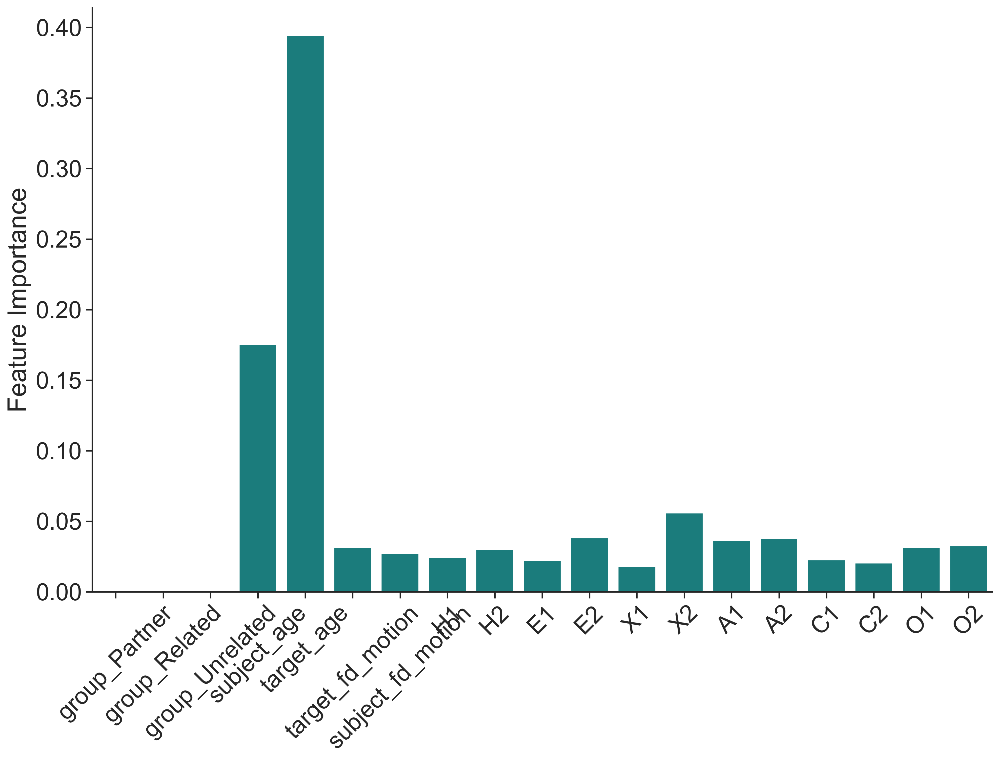

In [381]:
model_rfr_similarity_FINAL_feature_importance = model_rfr_similarity_FINAL.feature_importances_
plt.figure(figsize=(15,10),dpi=300)
rfr_similarity_feature = sns.barplot([
                             'group_Partner','group_Related','group_Unrelated',
                             'subject_age','target_age',
                            'target_fd_motion','subject_fd_motion',
                             'H1','H2','E1','E2','X1','X2','A1','A2','C1','C2','O1','O2'
            ], 
         model_rfr_similarity_FINAL_feature_importance,
        color='#0B8C8C')
rfr_similarity_feature.set(ylabel='Feature Importance')

for item in rfr_similarity_feature.get_xticklabels():
    item.set_rotation(45)
sns.despine()

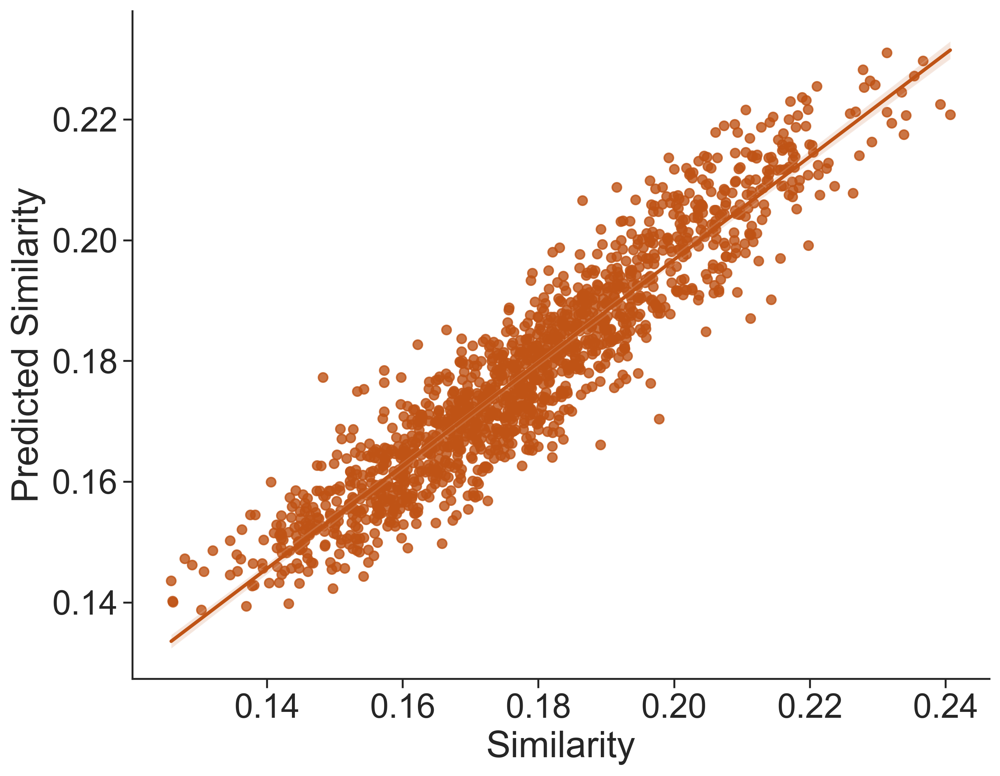

In [362]:
plt.figure(figsize=(10,8),dpi=300)
plt.ylabel("Predicted Similarity")
predictions_RF = model_rfr_similarity_FINAL.predict(X_test)
predictions_RF
sns.regplot(y_test,predictions_RF,
            order=1,
            ci=99,
           color=main_regression_color)
sns.despine()

## Resources

- https://scikit-learn.org/stable/modules/feature_extraction.html
- https://www.analyticsvidhya.com/blog/2019/08/3-techniques-extract-features-from-image-data-machine-learning-python/

- https://machinelearningmastery.com/cnn-models-for-human-activity-recognition-time-series-classification/
- https://chrisalbon.com/
- https://scikit-learn.org/stable/modules/feature_extraction.html

Feature extraction could be used to get the 400x400 (or 1d = 1x160,000) matrix into the right format for a classifier.

**IMPORTANT** 

I need to make sure I delete the 2nd scan session of the adolescents otherwise I might be overfitting with within subject data.


___

# 6.2 Predicting Age of participants

**Background Info**
- see: https://developpaper.com/polynomial-regression-and-model-generalization-in-machine-learning/
- https://towardsdatascience.com/polynomial-regression-with-scikit-learn-what-you-should-know-bed9d3296f2

**ATTENTION**

Polynomial features can lead to feature explosion and with 160,000 features this is not feasable.

- We need to do some feature selection first (https://towardsdatascience.com/feature-selection-with-pandas-e3690ad8504b)
- https://scikit-learn.org/stable/modules/feature_selection.html

## 6.2.1 - Split train and test set

In [241]:
# X predictor features 79800 1D array
# connectomes_classifier = family_classifier
connectomes_classifier = connectomes_classifier.T
connectomes_classifier.shape

(168, 79799)

In [242]:
y_age = covariates['age']
y_age_final = y_age.values.reshape((168,1))
y_age_final.shape

(168, 1)

In [283]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(
    connectomes_classifier,
    y_age_final,
    test_size=0.3) # 80% training and 30% test

## 6.2.2 - Cross-Validation (parameter tuning) only in TRAIN set

In [245]:
# Setting up the K-fold attributes for cross-validation of my models below
kf = KFold(n_splits=3, shuffle=True, random_state=1)

# Creating the cv-score Dataframe in pandas
cv_accuracies_age = pd.DataFrame()

In [259]:
# Create the models that we want to test
model_mlr_age = SGDRegressor()
model_dt_age = DecisionTreeRegressor(random_state=5)
model_rfr_age = RandomForestRegressor(random_state=5)

# Put the models in a list to be used for Cross-Validation
models = [model_mlr_age, model_dt_age, model_rfr_age]

# Run the Cross-Validation comparison with the models used in this analysis
comp, maes, mses, r2s, accs = cv_comparison(models, X_train, y_train, cv=kf)

[CV] END max_depth=50, max_features=sqrt, max_leaf_nodes=None, min_samples_split=2, splitter=best; total time=   2.2s
[CV] END max_depth=80, max_features=auto, max_leaf_nodes=5, min_samples_split=10, splitter=best; total time=   4.1s
[CV] END max_depth=90, max_features=auto, max_leaf_nodes=10, min_samples_split=10, splitter=best; total time=   5.6s
[CV] END max_depth=10, max_features=sqrt, max_leaf_nodes=2, min_samples_split=10, splitter=random; total time=   2.2s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=5, min_samples_split=10, splitter=best; total time=   2.4s
[CV] END max_depth=100, max_features=auto, max_leaf_nodes=10, min_samples_split=5, splitter=random; total time=   3.7s
[CV] END max_depth=40, max_features=auto, max_leaf_nodes=None, min_samples_split=10, splitter=random; total time=   4.3s
[CV] END max_depth=40, max_features=auto, max_leaf_nodes=None, min_samples_split=10, splitter=random; total time=   4.0s
[CV] END max_depth=40, max_features=auto, max_leaf_nod

[CV] END max_depth=50, max_features=sqrt, max_leaf_nodes=None, min_samples_split=2, splitter=best; total time=   2.3s
[CV] END max_depth=110, max_features=auto, max_leaf_nodes=None, min_samples_split=2, splitter=best; total time=   6.8s
[CV] END max_depth=90, max_features=auto, max_leaf_nodes=10, min_samples_split=10, splitter=best; total time=   5.7s
[CV] END max_depth=80, max_features=sqrt, max_leaf_nodes=None, min_samples_split=5, splitter=best; total time=   2.6s
[CV] END max_depth=60, max_features=sqrt, max_leaf_nodes=10, min_samples_split=10, splitter=random; total time=   2.5s
[CV] END max_depth=80, max_features=auto, max_leaf_nodes=None, min_samples_split=5, splitter=best; total time=   8.1s
[CV] END max_depth=110, max_features=sqrt, max_leaf_nodes=None, min_samples_split=5, splitter=best; total time=   2.7s
[CV] END max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_samples_split=2, splitter=random; total time=   2.9s
[CV] END max_depth=90, max_features=auto, max_leaf_n

[CV] END max_depth=80, max_features=auto, max_leaf_nodes=5, min_samples_split=10, splitter=best; total time=   4.4s
[CV] END max_depth=110, max_features=auto, max_leaf_nodes=None, min_samples_split=2, splitter=best; total time=   6.9s
[CV] END max_depth=60, max_features=auto, max_leaf_nodes=None, min_samples_split=2, splitter=random; total time=   5.1s
[CV] END max_depth=100, max_features=sqrt, max_leaf_nodes=10, min_samples_split=5, splitter=best; total time=   2.7s
[CV] END max_depth=80, max_features=auto, max_leaf_nodes=None, min_samples_split=5, splitter=best; total time=   8.7s
[CV] END max_depth=110, max_features=sqrt, max_leaf_nodes=None, min_samples_split=5, splitter=best; total time=   2.6s
[CV] END max_depth=None, max_features=sqrt, max_leaf_nodes=10, min_samples_split=2, splitter=random; total time=   2.9s
[CV] END max_depth=90, max_features=auto, max_leaf_nodes=None, min_samples_split=5, splitter=random; total time=   4.9s
[CV] END max_depth=60, max_features=auto, max_leaf_

[CV] END max_depth=30, max_features=auto, max_leaf_nodes=None, min_samples_split=10, splitter=best; total time=   5.4s
[CV] END max_depth=90, max_features=auto, max_leaf_nodes=None, min_samples_split=2, splitter=best; total time=   7.3s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=5, min_samples_split=10, splitter=best; total time=   2.3s
[CV] END max_depth=100, max_features=sqrt, max_leaf_nodes=10, min_samples_split=5, splitter=best; total time=   2.6s
[CV] END max_depth=60, max_features=sqrt, max_leaf_nodes=10, min_samples_split=10, splitter=random; total time=   2.5s
[CV] END max_depth=None, max_features=auto, max_leaf_nodes=5, min_samples_split=2, splitter=best; total time=   6.1s
[CV] END max_depth=60, max_features=sqrt, max_leaf_nodes=2, min_samples_split=2, splitter=random; total time=   2.5s
[CV] END max_depth=40, max_features=auto, max_leaf_nodes=5, min_samples_split=5, splitter=random; total time=   3.8s
[CV] END max_depth=90, max_features=auto, max_leaf_nodes=Non

[CV] END max_depth=80, max_features=auto, max_leaf_nodes=5, min_samples_split=10, splitter=best; total time=   4.4s
[CV] END max_depth=90, max_features=auto, max_leaf_nodes=None, min_samples_split=2, splitter=best; total time=   7.6s
[CV] END max_depth=10, max_features=sqrt, max_leaf_nodes=2, min_samples_split=10, splitter=random; total time=   2.2s
[CV] END max_depth=80, max_features=sqrt, max_leaf_nodes=None, min_samples_split=5, splitter=best; total time=   2.5s
[CV] END max_depth=100, max_features=auto, max_leaf_nodes=10, min_samples_split=5, splitter=random; total time=   3.7s
[CV] END max_depth=None, max_features=auto, max_leaf_nodes=5, min_samples_split=2, splitter=best; total time=   6.2s
[CV] END max_depth=20, max_features=auto, max_leaf_nodes=5, min_samples_split=2, splitter=random; total time=   3.3s
[CV] END max_depth=40, max_features=auto, max_leaf_nodes=5, min_samples_split=5, splitter=random; total time=   3.8s
[CV] END max_depth=50, max_features=sqrt, max_leaf_nodes=10,

[CV] END max_depth=30, max_features=auto, max_leaf_nodes=None, min_samples_split=10, splitter=best; total time=   5.3s
[CV] END max_depth=90, max_features=auto, max_leaf_nodes=None, min_samples_split=2, splitter=best; total time=   7.3s
[CV] END max_depth=10, max_features=sqrt, max_leaf_nodes=2, min_samples_split=10, splitter=random; total time=   2.2s
[CV] END max_depth=80, max_features=sqrt, max_leaf_nodes=None, min_samples_split=5, splitter=best; total time=   2.6s
[CV] END max_depth=60, max_features=sqrt, max_leaf_nodes=10, min_samples_split=10, splitter=random; total time=   2.5s
[CV] END max_depth=None, max_features=auto, max_leaf_nodes=5, min_samples_split=2, splitter=best; total time=   6.1s
[CV] END max_depth=60, max_features=sqrt, max_leaf_nodes=2, min_samples_split=2, splitter=random; total time=   2.5s
[CV] END max_depth=110, max_features=sqrt, max_leaf_nodes=None, min_samples_split=5, splitter=best; total time=   2.9s
[CV] END max_depth=20, max_features=sqrt, max_leaf_node

In [269]:
model_mlr_age = SGDRegressor()

In [284]:
r2s

[array([0.3559, 0.2627, 0.4206, 0.3338, 0.3673]),
 array([-0.1555, -0.6187, -0.1766, -0.1918, -0.4574]),
 array([0.3649, 0.3143, 0.1493, 0.303 , 0.3547])]

### Let's run Random Grid search Cross validation of hyper-parameters

### Linear Regression with Stochastic Gradient Decent (SGD)

- https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDRegressor.html

In [274]:
# Number of trees in random forest
max_iter = [int(x) for x in np.linspace(start = 1000, stop = 5000, num = 1000)]

# Number of features to consider at every split
loss = ['squared_loss', 'huber','epsilon_insensitive']

# Method of selecting samples for training each tree
shuffle = [True, False]

# Create the random grid
random_grid_age_mlr = {
                'max_iter': max_iter,
               'loss': loss,
               'shuffle': shuffle}
print(random_grid_age_mlr)

{'max_iter': [1000, 1004, 1008, 1012, 1016, 1020, 1024, 1028, 1032, 1036, 1040, 1044, 1048, 1052, 1056, 1060, 1064, 1068, 1072, 1076, 1080, 1084, 1088, 1092, 1096, 1100, 1104, 1108, 1112, 1116, 1120, 1124, 1128, 1132, 1136, 1140, 1144, 1148, 1152, 1156, 1160, 1164, 1168, 1172, 1176, 1180, 1184, 1188, 1192, 1196, 1200, 1204, 1208, 1212, 1216, 1220, 1224, 1228, 1232, 1236, 1240, 1244, 1248, 1252, 1256, 1260, 1264, 1268, 1272, 1276, 1280, 1284, 1288, 1292, 1296, 1300, 1304, 1308, 1312, 1316, 1320, 1324, 1328, 1332, 1336, 1340, 1344, 1348, 1352, 1356, 1360, 1364, 1368, 1372, 1376, 1380, 1384, 1388, 1392, 1396, 1400, 1404, 1408, 1412, 1416, 1420, 1424, 1428, 1432, 1436, 1440, 1444, 1448, 1452, 1456, 1460, 1464, 1468, 1472, 1476, 1480, 1484, 1488, 1492, 1496, 1500, 1504, 1508, 1512, 1516, 1520, 1524, 1528, 1532, 1536, 1540, 1544, 1548, 1552, 1556, 1560, 1564, 1568, 1572, 1576, 1580, 1584, 1588, 1592, 1596, 1600, 1604, 1608, 1612, 1616, 1620, 1624, 1628, 1632, 1636, 1640, 1644, 1648, 1652, 16

In [275]:
# Initializing random forest model and fitting the training data to the model
age_model_mlr = SGDRegressor()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
age_model_mlr_random = RandomizedSearchCV(estimator=age_model_mlr,
                                     param_distributions=random_grid_age_mlr,
                                     n_iter=250, # number of iterations/candidates
                                     cv=3, # number of k-folds
                                     verbose=2,
                                     random_state=42,
                                     n_jobs=-1)

# Fit the random search model
age_model_mlr_random.fit(X_train,y_train)

# Find the best parameters
best_mlr_param_age = age_model_mlr_random.best_params_

Fitting 3 folds for each of 250 candidates, totalling 750 fits


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:1225: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn("Maximum number of iteration reached before "
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/vali

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradien

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConv

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:1225: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn("Maximum number of iteration reached before "
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:1225: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn("Maximum number of iteration reached before "
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:1225: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn("Maximum number of iteration reached before "
/Library/Frameworks/Python.framework/Versions/3.9/li

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:1225: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn("Maximum number of iteration reached before "
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/utils/vali

In [277]:
age_model_mlr_random.best_params_

{'shuffle': True, 'max_iter': 2421, 'loss': 'squared_loss'}

#### For Decision Tree

In [249]:
# Initializing random forest model and fitting the training data to the model
age_model_dt = DecisionTreeRegressor()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
age_model_dt_random = RandomizedSearchCV(estimator=age_model_dt,
                                     param_distributions=random_grid_similarity_dt,
                                     n_iter=250, # number of iterations/candidates
                                     cv=3, # number of k-folds
                                     verbose=2,
                                     random_state=42,
                                     n_jobs=-1)

# Fit the random search model
age_model_dt_random.fit(X_train,y_train)

# Find the best parameters
best_dt_param_age = age_model_dt_random.best_params_

Fitting 3 folds for each of 250 candidates, totalling 750 fits


In [250]:
age_model_dt_random.best_params_

{'splitter': 'best',
 'min_samples_split': 10,
 'max_leaf_nodes': 2,
 'max_features': 'auto',
 'max_depth': 100}

#### For Random Forest

In [285]:
# Initializing random forest model and fitting the training data to the model
age_model_rfr = RandomForestRegressor()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
age_model_rfr_random = RandomizedSearchCV(estimator=age_model_rfr,
                                     param_distributions=random_grid_similarity_rfr,
                                     n_iter=10, # number of iterations/candidates
                                     cv=3, # number of k-folds
                                     verbose=2,
                                     random_state=42,
                                     n_jobs=-1)

# Fit the random search model
age_model_rfr_random.fit(X_train,y_train)

# Find the best parameters
best_rfr_param_age = age_model_rfr_random.best_params_

Fitting 3 folds for each of 10 candidates, totalling 30 fits


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Library/Frameworks/Pytho

KeyboardInterrupt: 

In [ ]:
age_model_rfr_random.best_params_

## 6.2.3 Final Model Evaluation in TEST set

In [278]:
# Finally we will look at the prediction for the multiple linear regression on the TEST set
model_mlr_age_FINAL = SGDRegressor(
                                max_iter=2400, 
                                loss='squared_loss',
                                shuffle=True)
model_mlr_age_FINAL.fit(X_train,y_train)

SGDRegressor(max_iter=2400)

In [262]:
model_dt_age_FINAL = DecisionTreeRegressor(
                                                splitter='best',
                                                min_samples_split=10,
                                                max_leaf_nodes=2,
                                                max_features= 'auto',
                                                max_depth=100)
model_dt_age_FINAL.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=100, max_features='auto', max_leaf_nodes=2,
                      min_samples_split=10)

In [263]:
model_rfr_age_FINAL = RandomForestRegressor(
                                n_estimators=1800, 
                                 min_samples_split=2, 
                                 min_samples_leaf=4,
                                 max_features='sqrt',
                                 max_depth=90,
                                 bootstrap=True)

# Train the tuned FINAL Model using ALL of the train set (80%), no k-folds or splits
model_rfr_age_FINAL.fit(X_train,y_train)

RandomForestRegressor(max_depth=90, max_features='sqrt', min_samples_leaf=4,
                      n_estimators=1800)

In [279]:
# Call the comparison function with the three final models
final_scores = final_comparison([model_mlr_age_FINAL, 
                                 model_dt_age_FINAL,
                                 model_rfr_age_FINAL], 
                                X_test, 
                                y_test)

# Adjust the column headers
final_scores.columns  = ['Linear Regression', 'Decision-Tree', 'Random Forest']
final_scores

,Linear Regression,Decision-Tree,Random Forest
Mean Absolute Error,14.0061,12.7936,15.2665
Mean Squared Error,227.4305,277.7602,258.9797
R^2,0.2100,0.0352,0.1004
Accuracy,34.2471,32.9246,31.7370


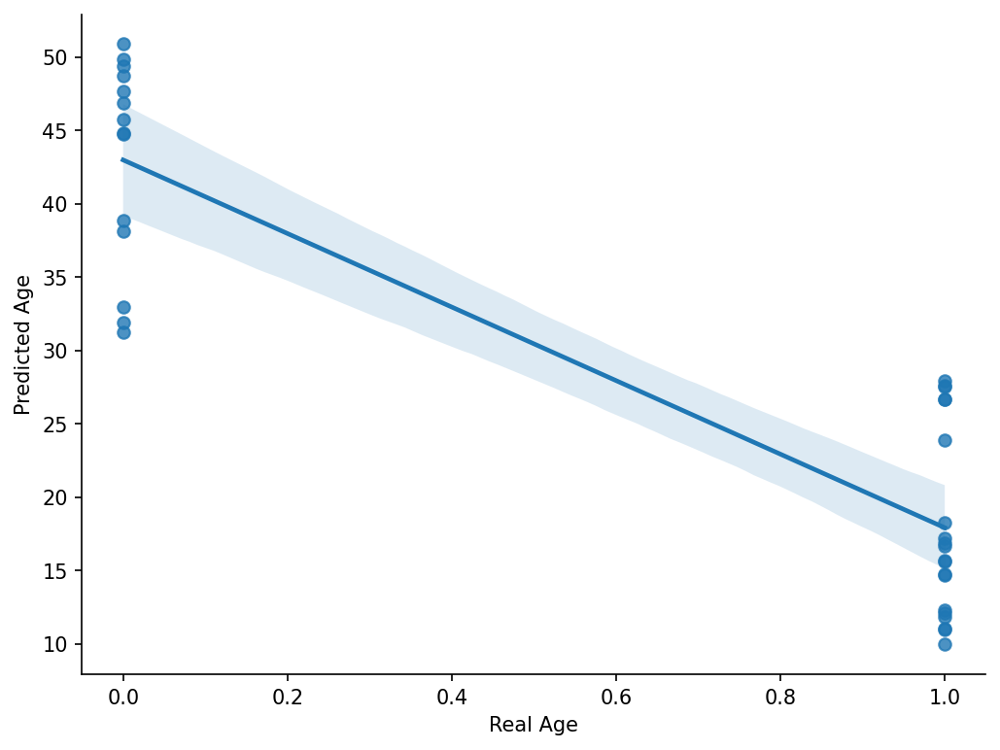

In [318]:
plt.figure(figsize=(8,6),dpi=150)
plt.ylabel("Predicted Age")
plt.xlabel("Real Age")
predictions_MLR = model_mlr_age_FINAL.predict(X_test)
predictions_MLR
sns.regplot(y_test,predictions_MLR,order=1)
sns.despine()

In [ ]:
model_rfr_similarity_FINAL_feature_importance = model_rfr_similarity_FINAL.feature_importances_
